In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
from numpy import linalg as la
from scipy.sparse import issparse
import loompy
import anndata
import scvelo as scv
scv.logging.print_version()

/home/kko1/.pyenv/versions/3.8.19/lib/python3.8/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/home/kko1/.pyenv/versions/3.8.19/lib/python3.8/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def dna_to_twobit(dna: str) -> int:
/home/kko1/.pyen

Running scvelo 0.3.2 (python 3.8.19) on 2025-08-12 09:03.


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white')

ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


scanpy==1.9.8 anndata==0.9.2 umap==0.5.6 numpy==1.24.4 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.1 igraph==0.11.8 pynndescent==0.5.13


In [3]:
import os
os.chdir('/mnt/d/KP/EKP_RKP')

In [4]:
import scanpy.external as sce

In [32]:
adata_A = sc.read('EKP_RKP_epithelial_pp_and_concatenated_04-22-24.h5ad')
adata_A

AnnData object with n_obs × n_vars = 1852 × 16482
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1'
    obsm: 'X_pca', 'X_umap'

In [33]:
# EKP
ekp_raw = sc.read_10x_mtx('D:/KP/EKP_RKP/EKP/outs/filtered_feature_bc_matrix',
                            var_names='gene_symbols', cache=True)

# RKP
rkp_raw = sc.read_10x_mtx('D:/KP/EKP_RKP/RKP/outs/filtered_feature_bc_matrix',
                            var_names='gene_symbols', cache=True)
                          

... reading from cache file cache\D-KP-EKP_RKP-EKP-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache\D-KP-EKP_RKP-RKP-outs-filtered_feature_bc_matrix-matrix.h5ad


In [34]:
ls = [ekp_raw,rkp_raw]

In [35]:
for a in ls:
    if a is not None:
        a.var_names_make_unique()
print('done')

done


In [36]:
raw = ekp_raw.concatenate(rkp_raw)                           
raw

AnnData object with n_obs × n_vars = 8011 × 32285
    obs: 'batch'
    var: 'gene_ids', 'feature_types'

In [39]:
adata_A.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch
AAACCCACAGTATGAA-1-0,3835,3829,16049.0,1046.0,6.517540,allograft,EKP,5,0
AAACGAAAGTAGGGTC-1-0,338,338,1239.0,1.0,0.080710,allograft,EKP,12,0
AAACGAATCTCGCTTG-1-0,656,656,1903.0,570.0,29.952705,allograft,EKP,5,0
AAACGCTAGTGGCGAT-1-0,4898,4898,26809.0,977.0,3.644298,allograft,EKP,5,0
AAACGCTCATGGAATA-1-0,4000,4000,21023.0,548.0,2.606669,allograft,EKP,10,0
...,...,...,...,...,...,...,...,...,...
TTTGATCCATGACTTG-1-1,694,694,1473.0,2.0,0.135777,allograft,RKP,10,1
TTTGGAGGTCTCGCGA-1-1,1346,1344,4410.0,80.0,1.814059,allograft,RKP,10,1
TTTGGAGTCATGGTAC-1-1,294,294,625.0,7.0,1.120000,allograft,RKP,6,1
TTTGTTGCAACAGCCC-1-1,236,236,940.0,617.0,65.638298,allograft,RKP,9,1


In [38]:
raw.obs

,batch
AAACCCACAACACACT-1-0,0
AAACCCACAGACTCTA-1-0,0
AAACCCACAGTATGAA-1-0,0
AAACGAAAGTAGGGTC-1-0,0
AAACGAACACAACGTT-1-0,0
...,...
TTTGGAGTCCCTCTTT-1-1,1
TTTGGAGTCTATCCAT-1-1,1
TTTGTTGCAACAGCCC-1-1,1
TTTGTTGCAGGATTCT-1-1,1


In [40]:
scv.utils.clean_obs_names(raw)
scv.utils.clean_obs_names(adata_A)

In [41]:
adata_A.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,type,leiden,batch,sample_batch
AAACCCACAGTATGAA,3835,3829,16049.0,1046.0,6.517540,allograft,EKP,5,0,-1-0
AAACGAAAGTAGGGTC,338,338,1239.0,1.0,0.080710,allograft,EKP,12,0,-1-0
AAACGAATCTCGCTTG,656,656,1903.0,570.0,29.952705,allograft,EKP,5,0,-1-0
AAACGCTAGTGGCGAT,4898,4898,26809.0,977.0,3.644298,allograft,EKP,5,0,-1-0
AAACGCTCATGGAATA,4000,4000,21023.0,548.0,2.606669,allograft,EKP,10,0,-1-0
...,...,...,...,...,...,...,...,...,...,...
TTTGATCCATGACTTG,694,694,1473.0,2.0,0.135777,allograft,RKP,10,1,-1-1
TTTGGAGGTCTCGCGA,1346,1344,4410.0,80.0,1.814059,allograft,RKP,10,1,-1-1
TTTGGAGTCATGGTAC,294,294,625.0,7.0,1.120000,allograft,RKP,6,1,-1-1
TTTGTTGCAACAGCCC,236,236,940.0,617.0,65.638298,allograft,RKP,9,1,-1-1


In [42]:
raw.obs

,batch,sample_batch
AAACCCACAACACACT,0,-1-0
AAACCCACAGACTCTA,0,-1-0
AAACCCACAGTATGAA,0,-1-0
AAACGAAAGTAGGGTC,0,-1-0
AAACGAACACAACGTT,0,-1-0
...,...,...
TTTGGAGTCCCTCTTT,1,-1-1
TTTGGAGTCTATCCAT,1,-1-1
TTTGTTGCAACAGCCC,1,-1-1
TTTGTTGCAGGATTCT,1,-1-1


In [43]:
raw_1= scv.utils.merge(adata_A, raw)
raw_1

AnnData object with n_obs × n_vars = 1852 × 16482
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'gene_ids', 'feature_types'
    obsm: 'X_pca', 'X_umap'

In [148]:
raw.obs['tissue']= raw_1.obs['tissue']
raw.obs['type']= raw_1.obs['type']
raw.obs['leiden']= raw_1.obs['leiden']
adata=raw[raw.obs['type'].isin(['EKP','RKP'])]
adata

View of AnnData object with n_obs × n_vars = 1852 × 32285
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden'
    var: 'gene_ids', 'feature_types'

In [149]:
df = pd.crosstab(adata.obs['type'], adata.obs['type'])
df

type,EKP,RKP
type,,
EKP,736,0
RKP,0,1116


In [150]:
adata.obs

,batch,sample_batch,tissue,type,leiden
AAACCCACAGTATGAA,0,-1-0,allograft,EKP,5
AAACGAAAGTAGGGTC,0,-1-0,allograft,EKP,12
AAACGAATCTCGCTTG,0,-1-0,allograft,EKP,5
AAACGCTAGTGGCGAT,0,-1-0,allograft,EKP,5
AAACGCTCATGGAATA,0,-1-0,allograft,EKP,10
...,...,...,...,...,...
TTTGATCCATGACTTG,1,-1-1,allograft,RKP,10
TTTGGAGGTCTCGCGA,1,-1-1,allograft,RKP,10
TTTGGAGTCATGGTAC,1,-1-1,allograft,RKP,6
TTTGTTGCAACAGCCC,1,-1-1,allograft,RKP,9


In [151]:
adata.obs.type = adata.obs.type.astype('category')
adata.obs.tissue = adata.obs.tissue.astype('category')

In [152]:
df = pd.crosstab(adata.obs['type'], adata.obs['tissue'])
df

tissue,allograft
type,
EKP,736
RKP,1116


filtered out 11794 genes that are detected in less than 1 cells


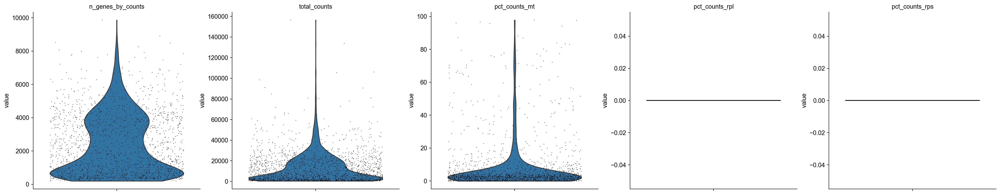

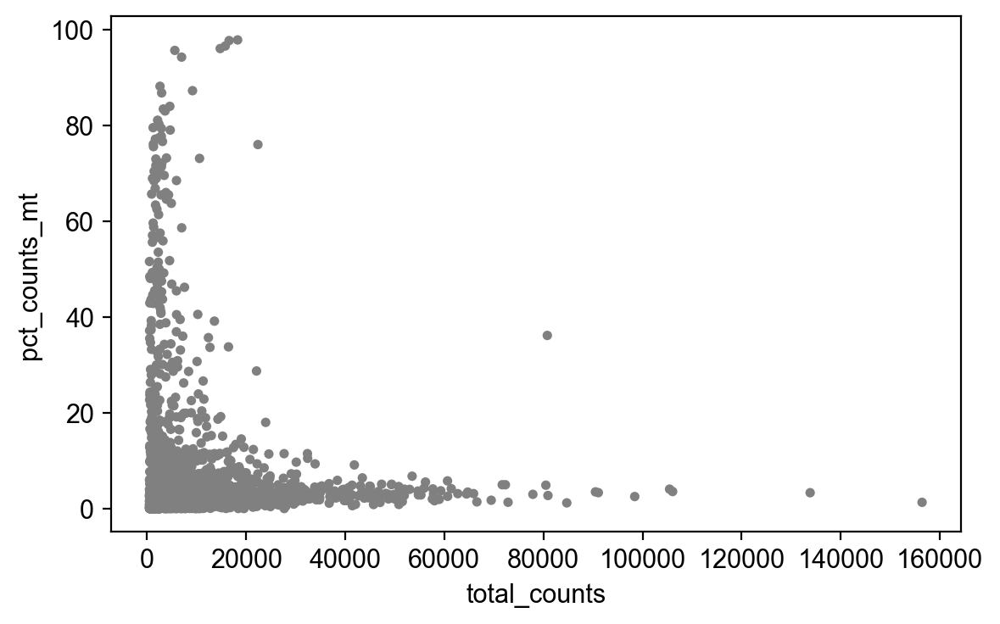

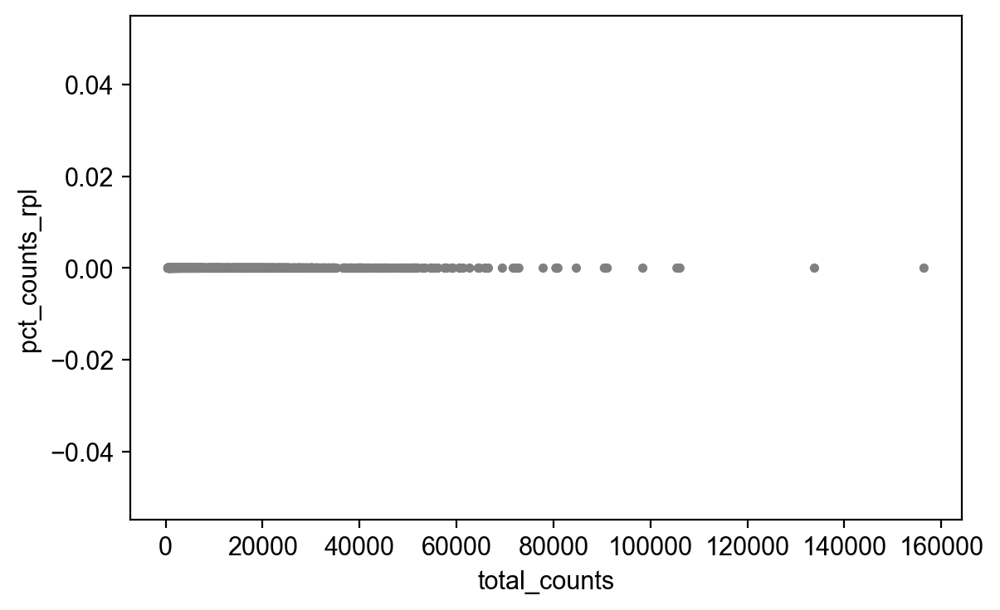

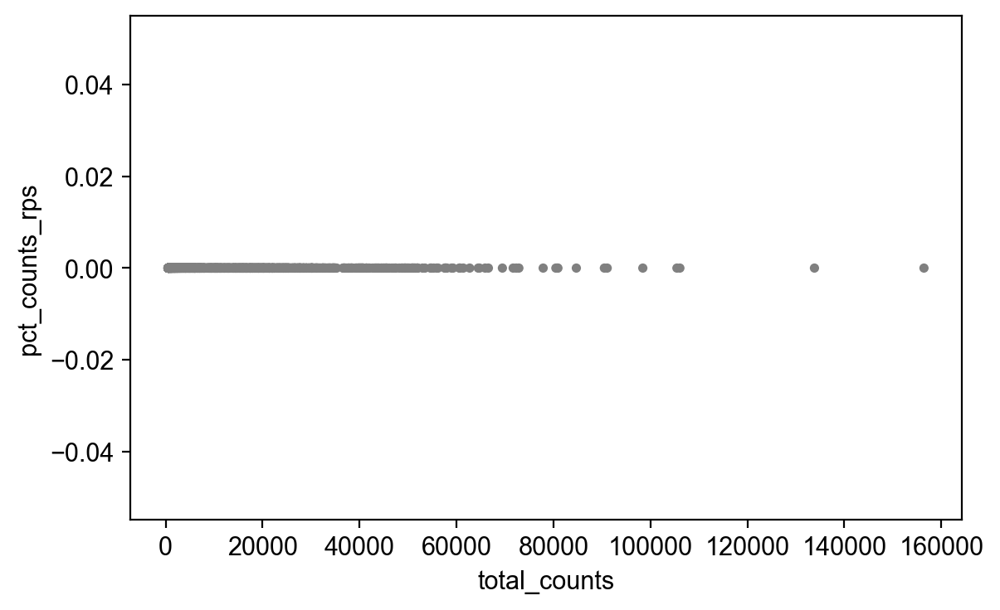

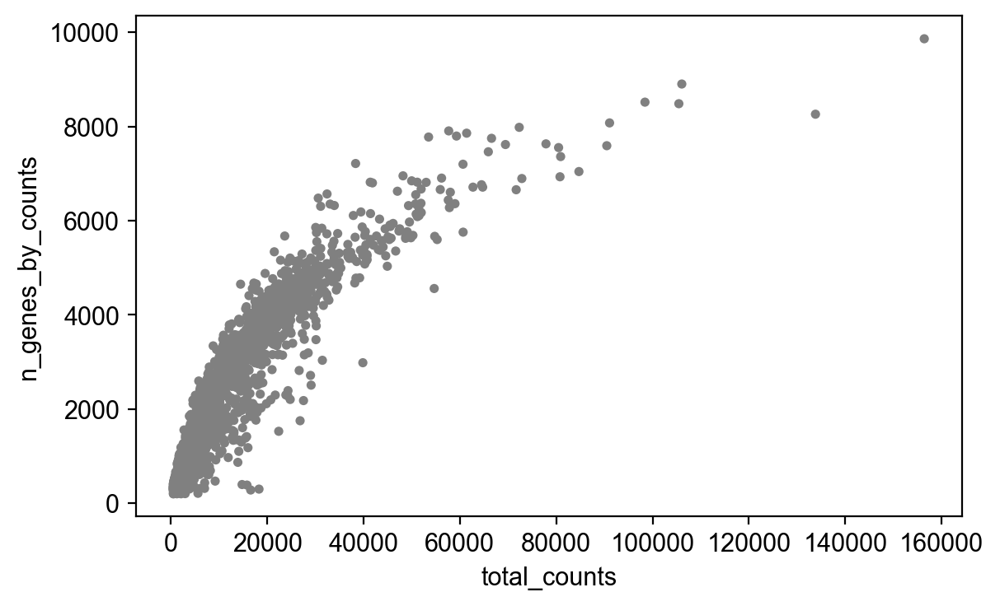

normalizing counts per cell
    finished (0:00:00)


AnnData object with n_obs × n_vars = 1832 × 20491
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'

In [153]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=1)
adata.var['mt'] = adata.var_names.str.startswith('mt-')
adata.var['rpl'] = adata.var_names.str.startswith('rpl')
adata.var['rps'] = adata.var_names.str.startswith('rps')

sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','rpl','rps'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, keys=['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_rpl','pct_counts_rps'], jitter=0.4, multi_panel=True)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='pct_counts_rpl')
sc.pl.scatter(adata, x='total_counts', y='pct_counts_rps')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')
adata = adata[adata.obs.n_genes_by_counts < 8000, :]
adata = adata[adata.obs.pct_counts_mt < 80, :]
adata = adata[adata.obs.pct_counts_rpl < 30, :]
adata = adata[adata.obs.pct_counts_rps < 25, :]

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata

In [154]:
sc.tl.pca(adata)
sc.pp.neighbors(adata)

computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [155]:
#malat1 = adata.var_names.str.startswith('MALAT1')
# we need to redefine the mito_genes since they were first 
# calculated on the full object before removing low expressed genes.
mito_genes = adata.var_names.str.startswith('mt-')
hb_genes = adata.var_names.str.contains('^Hb[^(P)]')

remove = np.add(mito_genes, hb_genes)#, malat1)
#remove = np.add(remove, hb_genes)
keep = np.invert(remove)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

1832 20470


In [156]:
adata.raw = adata

In [158]:
#sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.leiden(adata)
sc.tl.umap(adata)
adata

computing PCA
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


AnnData object with n_obs × n_vars = 1832 × 20470
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [159]:
adata.write('Epi_before_harmony_more_genes_04-30-24.h5ad', compression='gzip')

In [5]:
adata = sc.read('Epi_before_harmony_more_genes_04-30-24.h5ad')
adata

AnnData object with n_obs × n_vars = 1832 × 20470
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [160]:
adata

AnnData object with n_obs × n_vars = 1832 × 20470
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

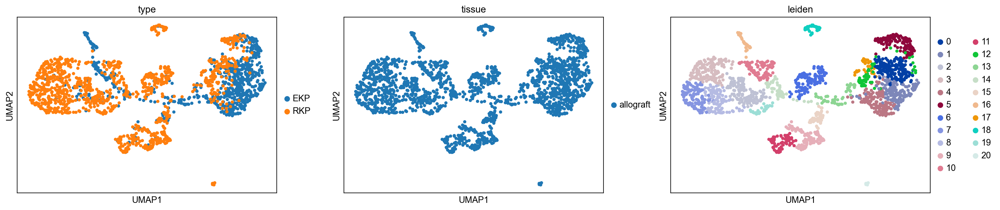

In [161]:
sc.pl.umap(adata, color=['type','tissue','leiden'])

In [162]:
adata_1 = adata

In [172]:
adata =adata_1

In [173]:
#############################################################
############ Harmony batch correction #######################
#############################################################

sce.pp.harmony_integrate(adata, 'batch')
'X_pca_harmony' in adata.obsm
True

2024-04-30 07:55:11,613 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-04-30 07:55:12,114 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-04-30 07:55:12,120 - harmonypy - INFO - Iteration 1 of 10
2024-04-30 07:55:12,324 - harmonypy - INFO - Iteration 2 of 10
2024-04-30 07:55:12,518 - harmonypy - INFO - Iteration 3 of 10
2024-04-30 07:55:12,705 - harmonypy - INFO - Converged after 3 iterations


True

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


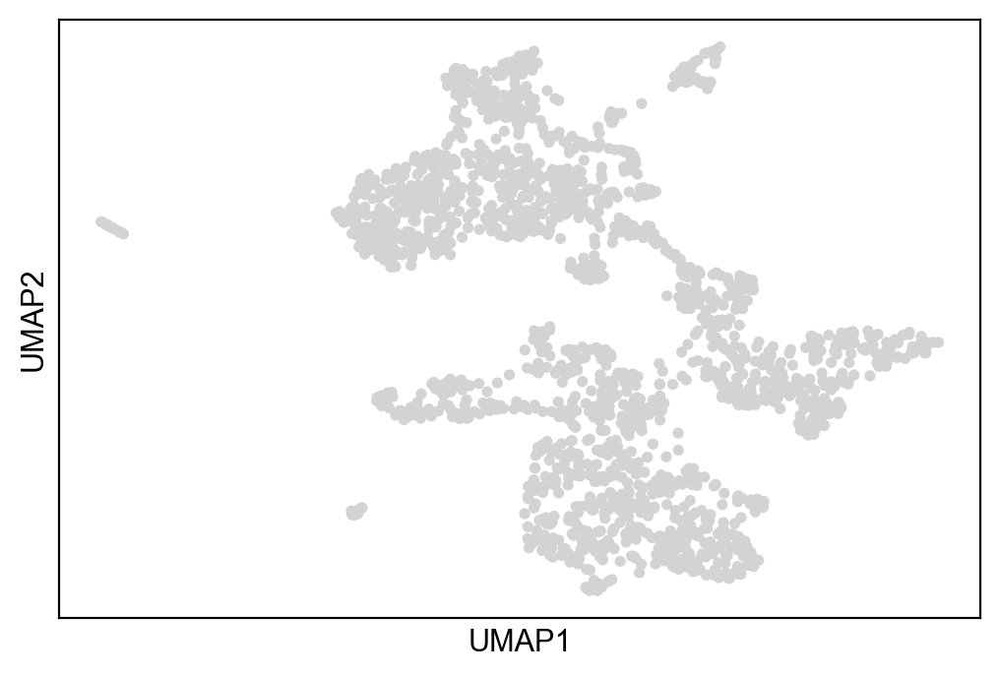

In [174]:
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.1)
sc.pl.umap(adata)

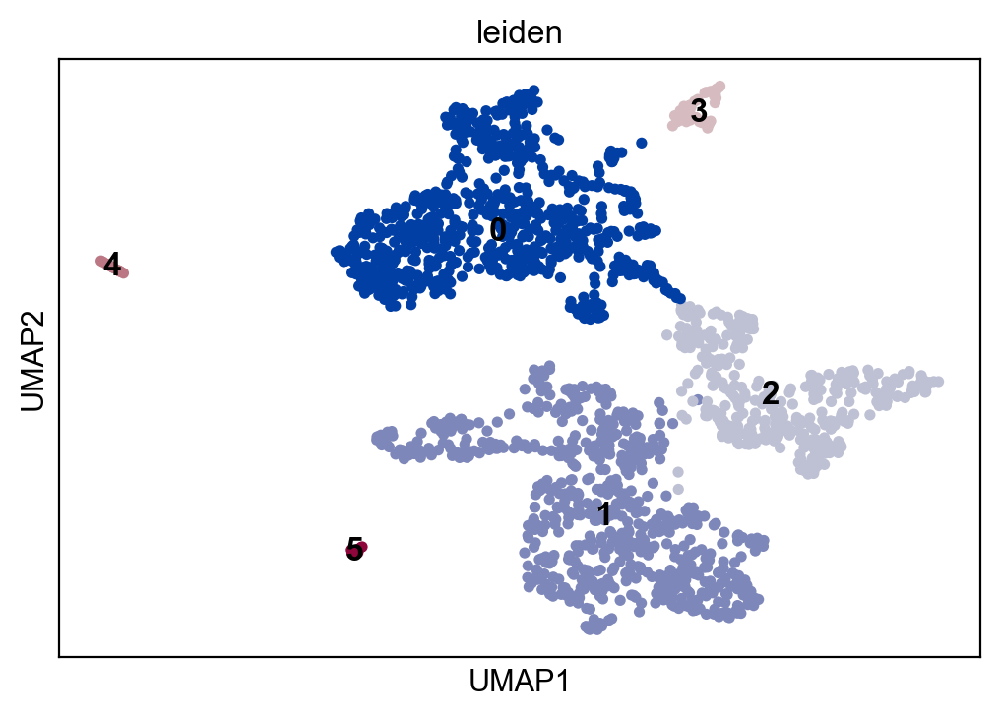

In [177]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')

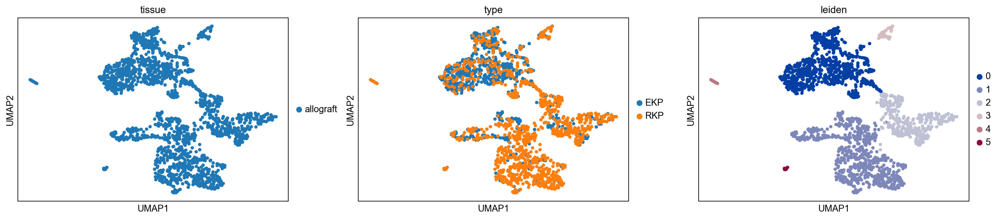

In [176]:
sc.pl.umap(adata, color=['tissue','type','leiden'])

In [66]:
df = pd.crosstab(adata.obs['type'], adata.obs['leiden'])
df

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
type,,,,,,,,,,,,,,,
EKP,246,0,128,7,22,77,46,13,19,73,5,6,5,1,3
RKP,75,266,74,152,105,36,47,79,63,2,37,29,29,24,21


In [111]:
df = pd.crosstab(adata.obs['type'], adata.obs['type'])
df

type,EKP,RKP
type,,
EKP,651,0
RKP,0,1039


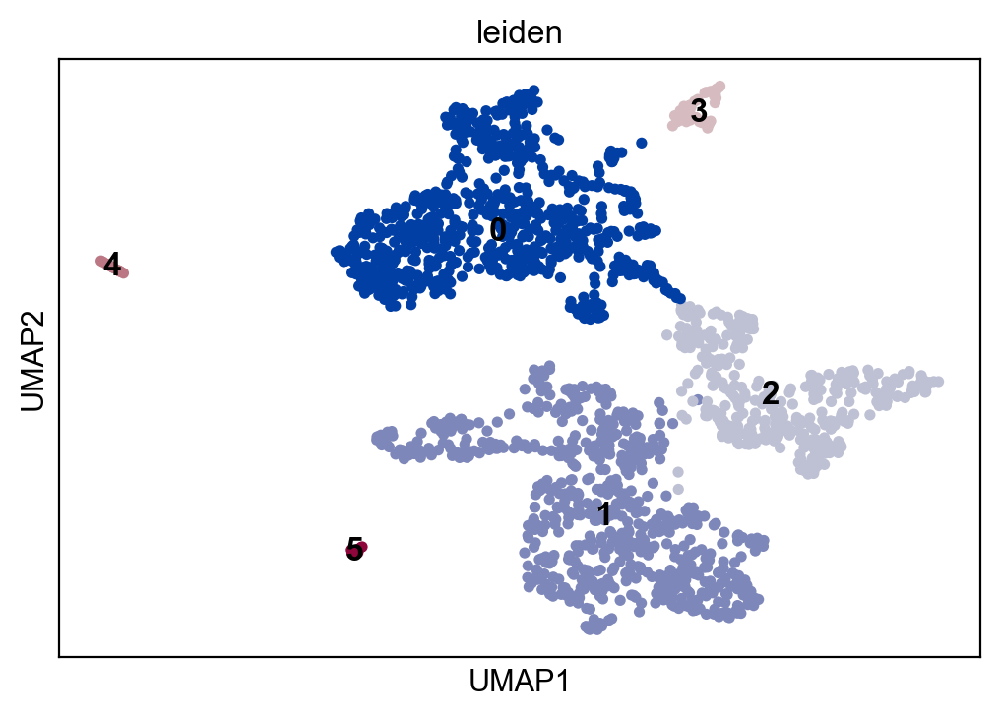

In [178]:
sc.pl.umap(adata, color=['leiden'], legend_loc = 'on data')

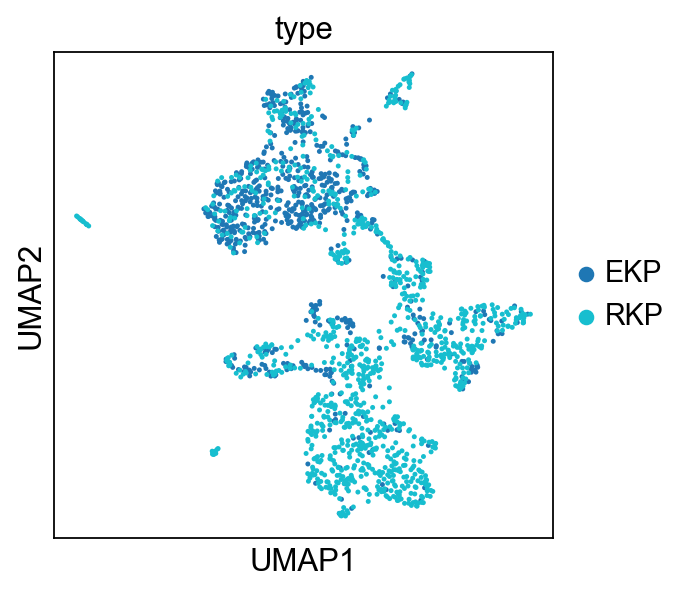

In [25]:
sc.pl.umap(adata, color=['type'],palette='tab10', size=20, save='_EKP_RKP_epi_by_type_05-07-24.pdf')

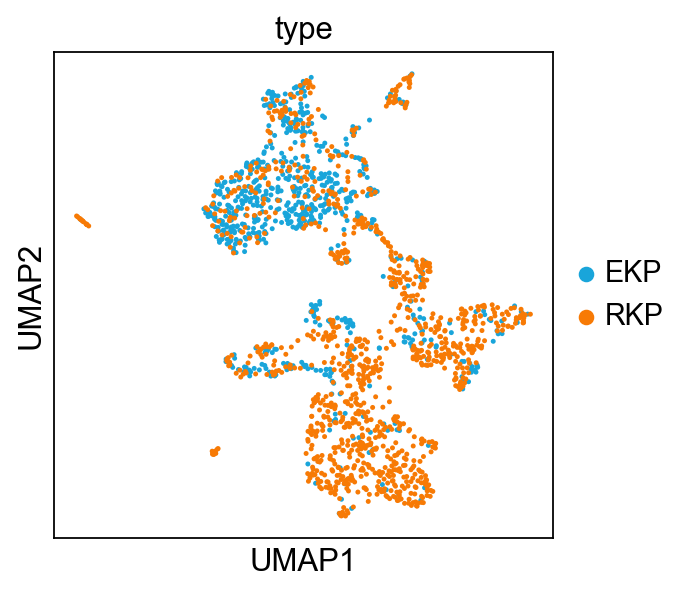

In [51]:
sc.pl.umap(adata, color=['type'],palette=["#19A5DA", "#F77A05"], size=20, save='_EKP_RKP_epi_by_type_05-28-24.pdf')

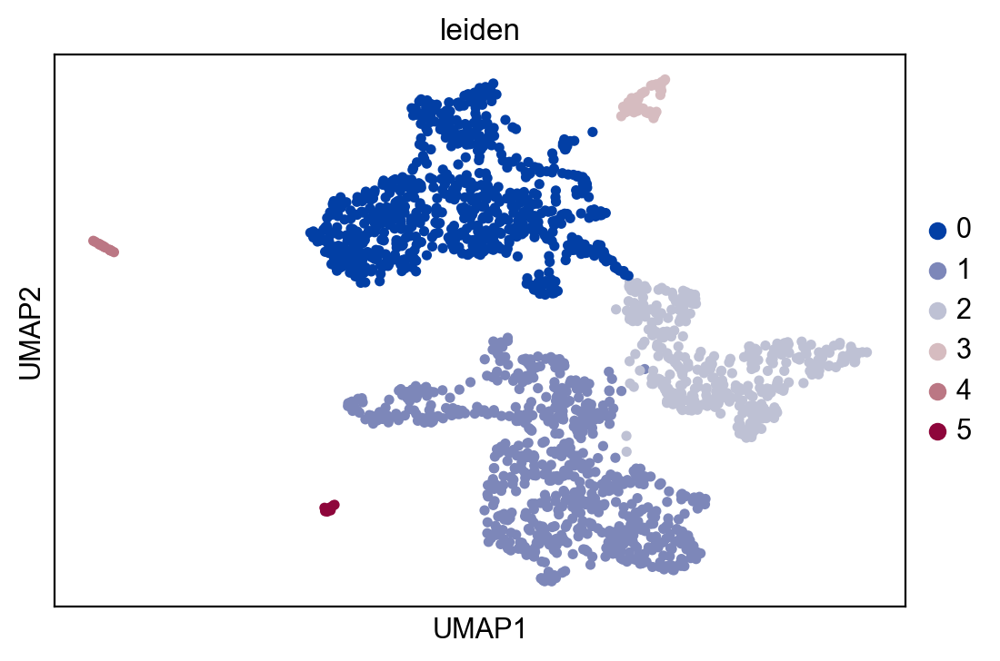

In [231]:
sc.pl.umap(adata, color=['leiden'], save='_EKP_RKP_epi_by_leiden_04-30-24.pdf')

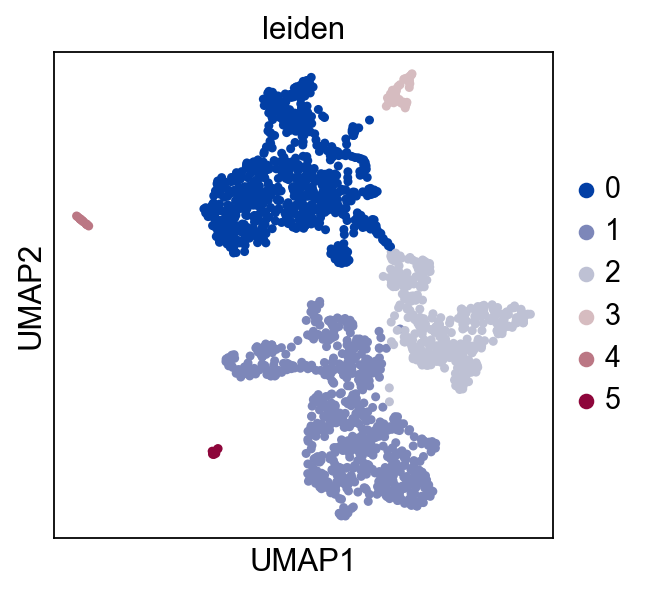

In [7]:
sc.pl.umap(adata, color=['leiden'], save='_EKP_RKP_epi_by_leiden_05-07-24.pdf')

In [181]:
adata.obs

,batch,sample_batch,tissue,type,leiden,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_rpl,pct_counts_rpl,total_counts_rps,pct_counts_rps
AAACCCACAGTATGAA,0,-1-0,allograft,EKP,0,3835,3835,16059.0,1046.0,6.513482,0.0,0.0,0.0,0.0
AAACGAAAGTAGGGTC,0,-1-0,allograft,EKP,2,338,338,1239.0,1.0,0.080710,0.0,0.0,0.0,0.0
AAACGAATCTCGCTTG,0,-1-0,allograft,EKP,2,656,656,1903.0,570.0,29.952705,0.0,0.0,0.0,0.0
AAACGCTAGTGGCGAT,0,-1-0,allograft,EKP,0,4898,4898,26809.0,977.0,3.644298,0.0,0.0,0.0,0.0
AAACGCTCATGGAATA,0,-1-0,allograft,EKP,0,4000,4000,21023.0,548.0,2.606669,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGATCCATGACTTG,1,-1-1,allograft,RKP,2,694,694,1473.0,2.0,0.135777,0.0,0.0,0.0,0.0
TTTGGAGGTCTCGCGA,1,-1-1,allograft,RKP,2,1346,1346,4412.0,80.0,1.813237,0.0,0.0,0.0,0.0
TTTGGAGTCATGGTAC,1,-1-1,allograft,RKP,2,294,294,625.0,7.0,1.120000,0.0,0.0,0.0,0.0
TTTGTTGCAACAGCCC,1,-1-1,allograft,RKP,1,236,236,940.0,617.0,65.638298,0.0,0.0,0.0,0.0


In [52]:
scv.set_figure_params(style='scvelo', dpi=100, dpi_save=300, frameon=None)

saving figure to file ./figures/scvelo__scatterplot_by_type_05-07-24.pdf


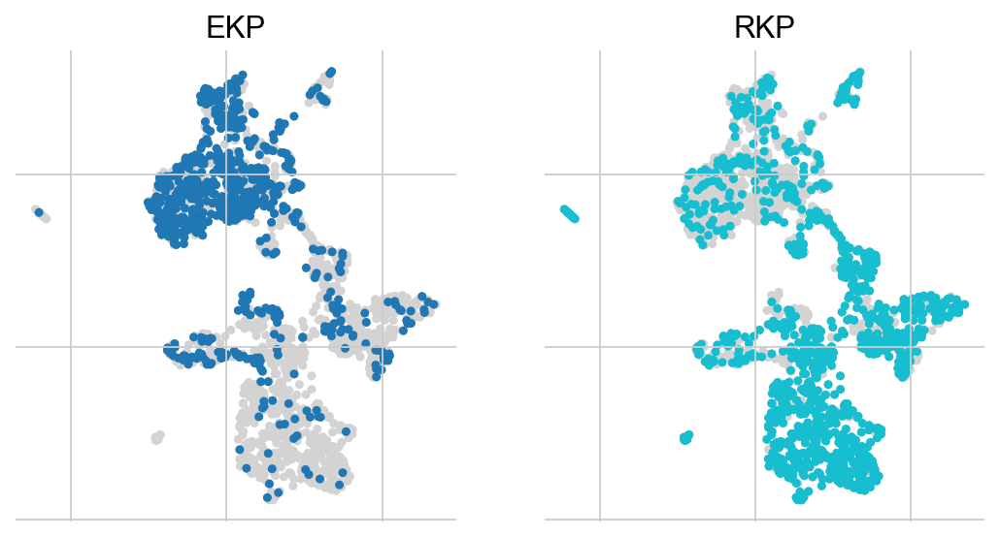

In [8]:
scv.pl.scatter(adata, groups=[[c] for c in adata.obs['type'].cat.categories], color='type', ncols=4, save="_scatterplot_by_type_05-07-24.pdf")

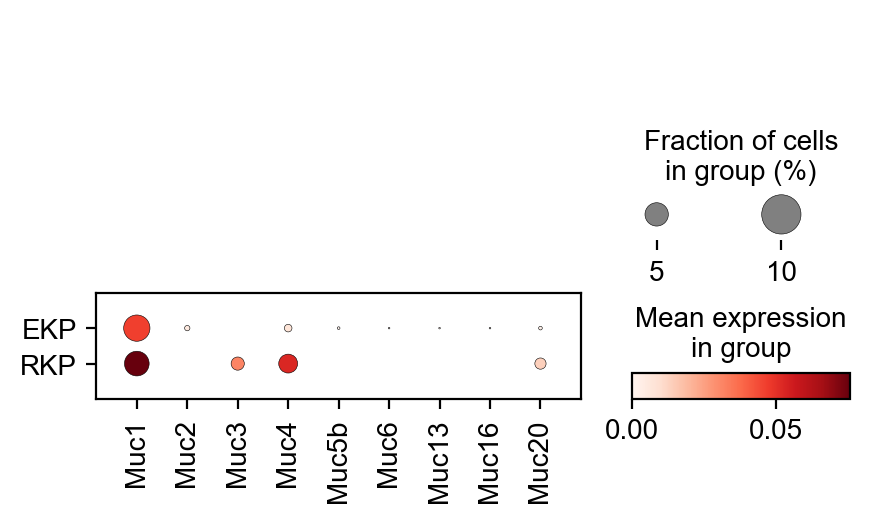

In [228]:
sc.pl.dotplot(adata, ['Muc1','Muc2',
                      'Muc3','Muc4',#'Muc5ac',
                      'Muc5b', 'Muc6', #'Muc7', 
                      #'Muc8',#'Muc10','Muc11','Muc12',
                      'Muc13',#'Muc15',
                      'Muc16',#'Muc19',
                      'Muc20',#'Muc21'
                     ], groupby='type', swap_axes=False, save='_Mucs_by_type_04-30-24.pdf')

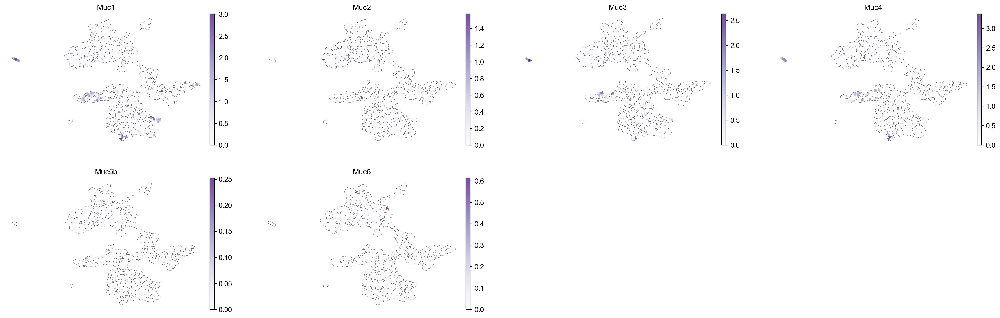

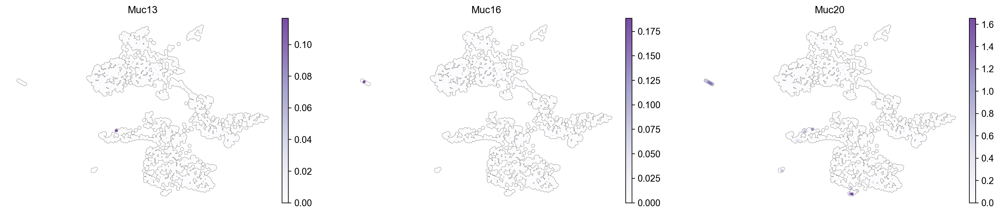

In [229]:
sc.pl.umap(adata, color=['Muc1','Muc2','Muc3','Muc4','Muc5b', 'Muc6'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_Mucs_in_Tumor_1_04-30-24.pdf')
sc.pl.umap(adata, color=['Muc13','Muc16','Muc20'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_Mucs_in_Tumor_2_04-30-24.pdf')

# SRCC markers

In [ ]:
# Thbs1, Serpine1 : correlation with SRC by SEER and TCGA, Frontiers in surgery (2022)
# Wfdc2 : GRCC marker, Gastroenterology (2008)
# Tff2, Tff1 : Mucous cell marker, SRCC cells were identified in mucous cells, Nature comm (2023)
# Msmb, Cldn18 : GSRC marker, Nature comm (2023)

sc.pl.violin(adata, ['Thbs1','Serpine1','Wfdc2','Tff2','Tff1','Cldn18'], groupby='type', swap_axes=False, save='_SRCC_markers_by_type.pdf')

In [51]:
adata.uns['log1p']["base"] = None
sc.tl.rank_genes_groups(adata, 'type', method='t-test')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [52]:
result_T_ekprkp = adata.uns['rank_genes_groups']
groups_T_ekprkp = result_T_ekprkp['names'].dtype.names
pval_table_T_ekprkp = pd.DataFrame(
            {group + '_' + key[:2]: result_T_ekprkp[key][group]
            for group in groups_T_ekprkp for key in ['names', 'pvals_adj']})
pval_table_T_ekprkp

,EKP_na,EKP_pv,RKP_na,RKP_pv
0,Malat1,1.547461e-148,Cmss1,2.140906e-291
1,Gnaq,2.432271e-138,Gphn,1.776165e-248
2,Spag9,3.631193e-116,Gm42418,2.617366e-207
3,Gab2,8.280278e-117,AY036118,2.383742e-162
4,Ext1,1.339903e-113,Gm19951,3.647113e-160
...,...,...,...,...
20465,Gm19951,3.647113e-160,Ext1,1.339903e-113
20466,AY036118,2.383742e-162,Gab2,8.280278e-117
20467,Gm42418,2.617366e-207,Spag9,3.631193e-116
20468,Gphn,1.776165e-248,Gnaq,2.432271e-138


In [53]:
pval_table_T_ekprkp.loc[pval_table_T_ekprkp['RKP_na'].isin(['Thbs1','Serpine1','Wfdc2','Tff2','Tff1','Cldn18'])]

,EKP_na,EKP_pv,RKP_na,RKP_pv
18,Rai14,7.848563e-97,Cldn18,5.484154e-51
61,Btg1,7.495214e-80,Wfdc2,3.734310e-28
999,Tmem50a,8.961420e-28,Tff2,7.664717e-04
3029,Csgalnact2,4.883373e-08,Tff1,2.865591e-01
18897,Serp2,2.028537e-02,Serpine1,1.502104e-18
20229,Mxra8,3.883380e-13,Thbs1,4.109716e-53


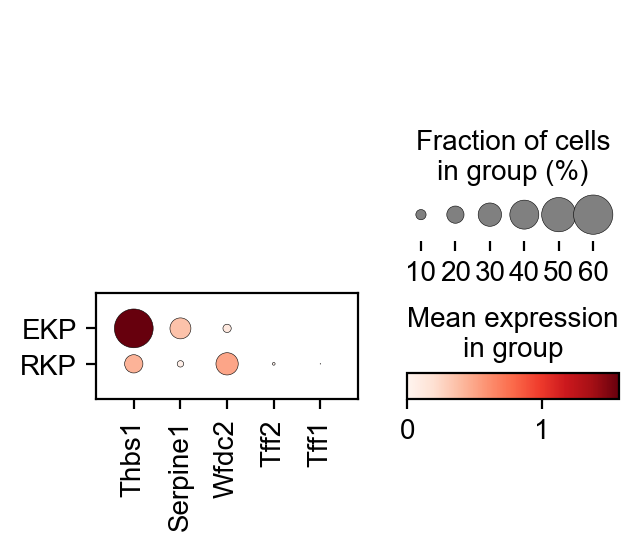

In [222]:
sc.pl.dotplot(adata, ['Thbs1','Serpine1','Wfdc2','Tff2','Tff1'], groupby='type', swap_axes=False, save='_srcc_markers_by_tissue.pdf')

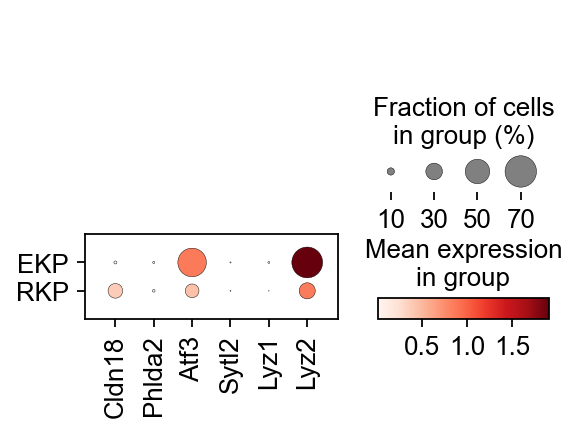

In [39]:
sc.pl.dotplot(adata, ['Cldn18','Phlda2','Atf3','Sytl2','Lyz1','Lyz2'], groupby='type', swap_axes=False)#, save='_srcc_markers_by_tissue.pdf')

In [ ]:
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Thbs1','Serpine1','Wfdc2','Tff2','Tff1'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=3, size=50, cmap='Purples',save='_srcc_markers_in_EKP_Tumor_1.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Thbs1','Serpine1','Wfdc2','Tff2','Tff1'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=3, size=50, cmap='Purples',save='_srcc_markers_in_RKP_Tumor_1.pdf')

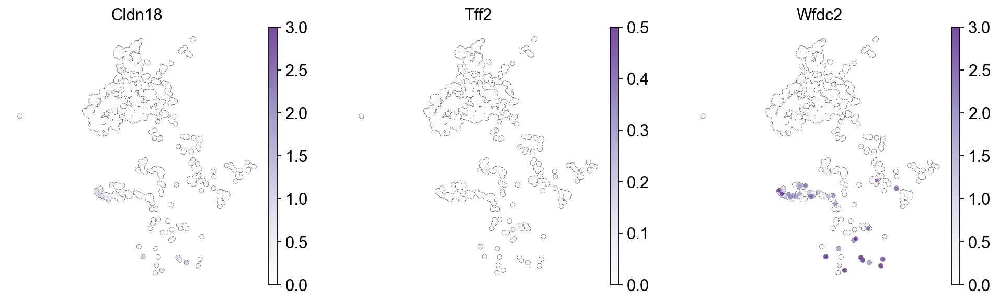

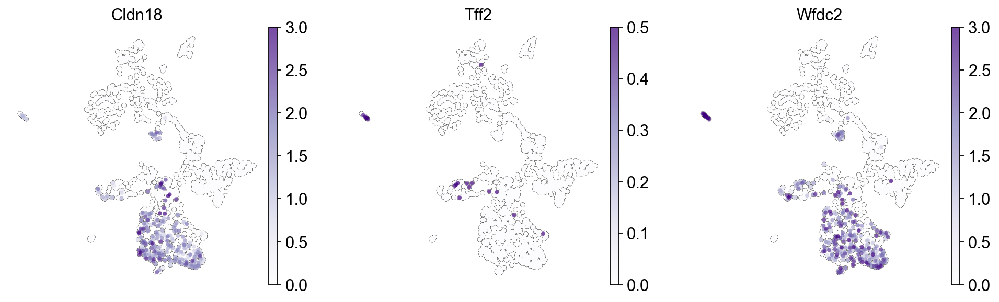

In [58]:
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Cldn18','Tff2','Wfdc2'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=(3,0.5,3), size=50, cmap='Purples',save='_srcc_markers(sorted)_in_EKP_Tumor_1.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Cldn18','Tff2','Wfdc2'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=(3,0.5,3), size=50, cmap='Purples',save='_srcc_markers(sorted)_in_RKP_Tumor_1.pdf')

# DEG for fGSEA 

In [224]:
#for fGSEA
sc.tl.rank_genes_groups(adata, groupby='type', method='wilcoxon', use_raw=True,  key_added = "EKP_RKP_Tumor_rank_fgsea")
result = adata.uns['EKP_RKP_Tumor_rank_fgsea']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores','logfoldchanges', 'pvals', 'pvals_adj']}).to_csv("D:/KP/EKP_RKP/EKP_RKP_Tumor_fgsea.csv")
# logFC becomes negative or disappear when use_raw=False, could be Scanpy bug


ranking genes
    finished: added to `.uns['EKP_RKP_Tumor_rank_fgsea']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [225]:
#for fGSEA
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon', use_raw=True,  key_added = "Leiden_Tumor_rank_fgsea")
result = adata.uns['Leiden_Tumor_rank_fgsea']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores','logfoldchanges', 'pvals', 'pvals_adj']}).to_csv("D:/KP/EKP_RKP/Leiden_Tumor_fgsea.csv")
# logFC becomes negative or disappear when use_raw=False, could be Scanpy bug


ranking genes
    finished: added to `.uns['Leiden_Tumor_rank_fgsea']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [226]:
adata.write('Epi_after_harmony_more_genes_04-30-24.h5ad', compression='gzip')

In [5]:
adata = sc.read('Epi_after_harmony_more_genes_04-30-24.h5ad')
adata

AnnData object with n_obs × n_vars = 1832 × 20470
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'EKP_RKP_Tumor_rank_fgsea', 'Leiden_Tumor_rank_fgsea', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'tissue_colors', 'type_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [16]:
adata.uns['log1p']["base"] = None

In [28]:
sc.tl.rank_genes_groups(adata, groupby= 'leiden', method='wilcoxon', use_raw=True,  key_added = "EKP_RKP_Tumor_cluster_rank")

ranking genes
    finished: added to `.uns['EKP_RKP_Tumor_cluster_rank']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


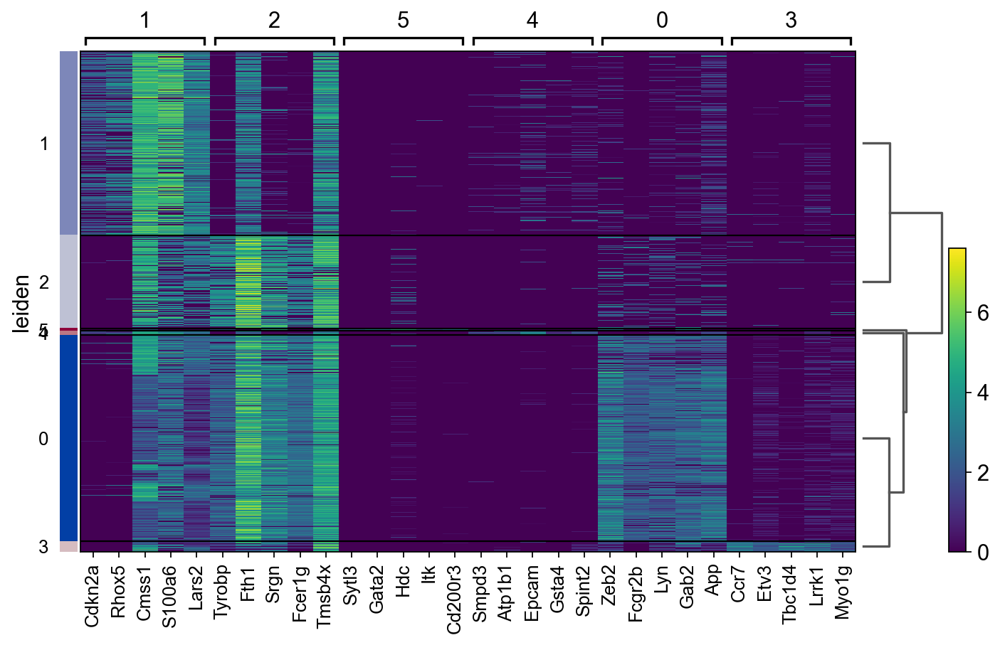

In [40]:
sc.pl.rank_genes_groups_heatmap(adata, show_gene_labels=True, key="EKP_RKP_Tumor_cluster_rank",n_genes=5, save='_tumor_by_leiden.pdf')

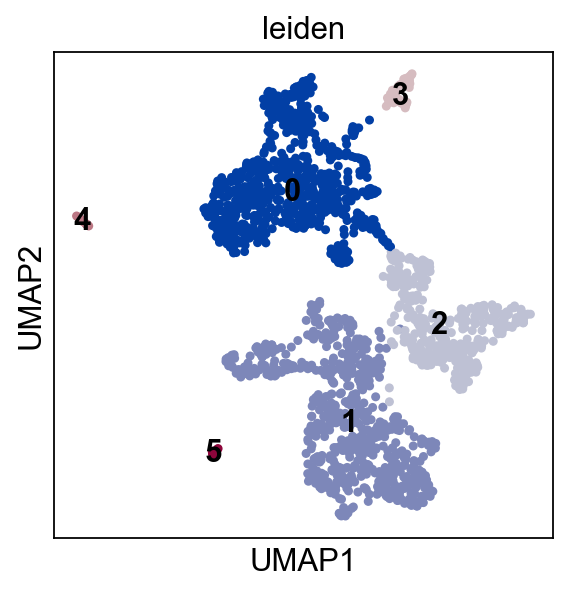

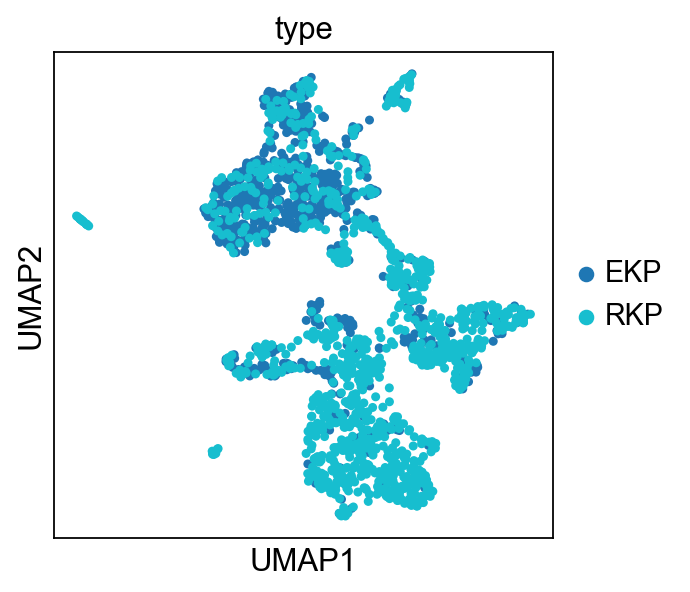

In [38]:
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')#, save='_EKP_RKP_epi_by_leiden_05-07-24.pdf')
sc.pl.umap(adata, color=['type'])

# p-value of gene expression

In [8]:
sc.tl.rank_genes_groups(adata, 'type', method='t-test')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [9]:
result_T_ekprkp = adata.uns['rank_genes_groups']
groups_T_ekprkp = result_T_ekprkp['names'].dtype.names
pval_table_T_ekprkp = pd.DataFrame(
            {group + '_' + key[:2]: result_T_ekprkp[key][group]
            for group in groups_T_ekprkp for key in ['names', 'pvals_adj']})
pval_table_T_ekprkp

,EKP_na,EKP_pv,RKP_na,RKP_pv
0,Malat1,1.547461e-148,Cmss1,2.140906e-291
1,Gnaq,2.432271e-138,Gphn,1.776165e-248
2,Spag9,3.631193e-116,Gm42418,2.617366e-207
3,Gab2,8.280278e-117,AY036118,2.383742e-162
4,Ext1,1.339903e-113,Gm19951,3.647113e-160
...,...,...,...,...
20465,Gm19951,3.647113e-160,Ext1,1.339903e-113
20466,AY036118,2.383742e-162,Gab2,8.280278e-117
20467,Gm42418,2.617366e-207,Spag9,3.631193e-116
20468,Gphn,1.776165e-248,Gnaq,2.432271e-138


In [18]:
pval_table_T_ekprkp.loc[pval_table_T_ekprkp['RKP_na'].isin(['Mki67','Top2a','Stmn1','Aqp5','Tff1','Tff2','Wfdc2','Lgr5','Muc1','Muc4'])]

,EKP_na,EKP_pv,RKP_na,RKP_pv
40,Baz2b,4.454053e-87,Aqp5,1.220918e-34
61,Btg1,7.495214e-80,Wfdc2,3.734310e-28
238,Stat3,3.304572e-55,Stmn1,3.145876e-13
641,Ctss,2.238488e-36,Muc4,6.292671e-06
867,Nrg1,6.377887e-30,Mki67,1.870040e-04
999,Tmem50a,8.961420e-28,Tff2,7.664717e-04
1637,Pbrm1,3.429872e-18,Top2a,2.669253e-02
2022,Myadm,2.601359e-14,Muc1,7.715855e-02
3029,Csgalnact2,4.883373e-08,Tff1,2.865591e-01
5037,Serpinb2,3.278041e-03,Lgr5,4.718417e-01


In [19]:
pval_table_T_ekprkp.loc[pval_table_T_ekprkp['EKP_na'].isin(['Runx1'])]

,EKP_na,EKP_pv,RKP_na,RKP_pv
140,Runx1,2.529629e-65,Chd3,4.483244e-18


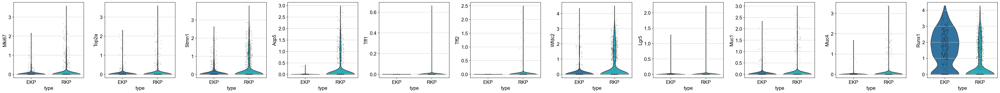

In [49]:
sc.pl.violin(adata, ['Mki67','Top2a','Stmn1','Aqp5','Tff1','Tff2','Wfdc2','Lgr5','Muc1','Muc4','Runx1'], groupby='type', swap_axes=False, save='_Tumor_markers_by_genotype.pdf')

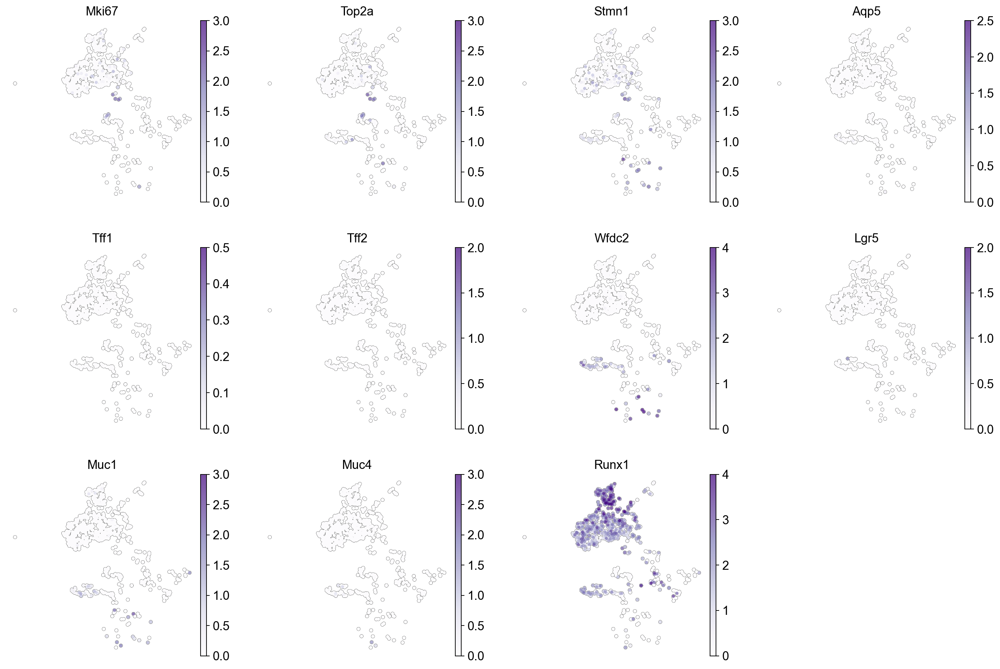

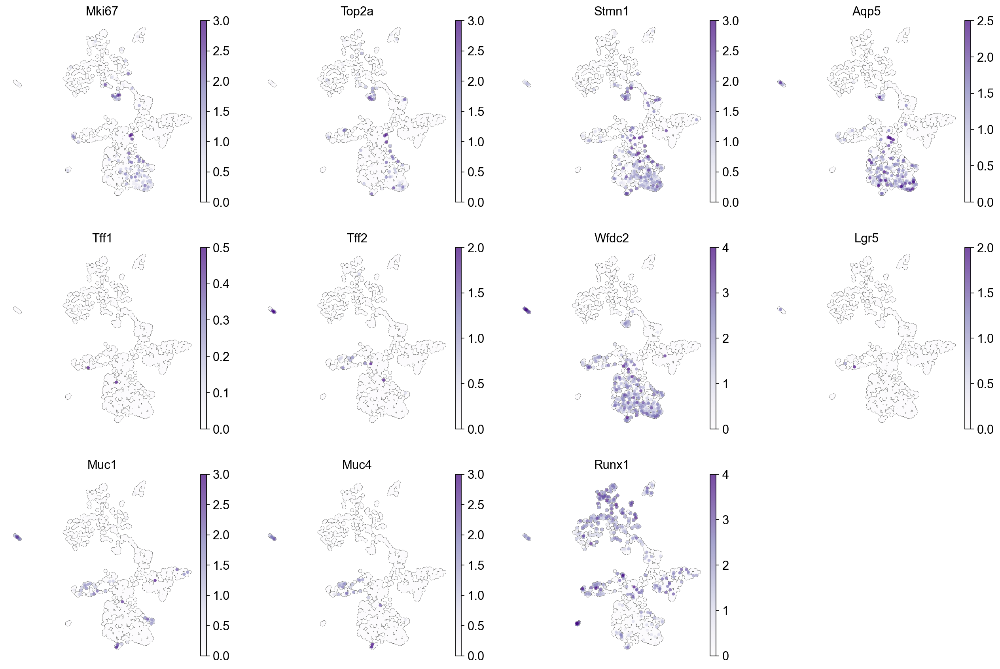

In [52]:
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Mki67','Top2a','Stmn1','Aqp5','Tff1','Tff2','Wfdc2','Lgr5','Muc1','Muc4','Runx1'],vmax=(3, 3, 3, 2.5, 0.5, 2.0, 4, 2, 3, 3, 4), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_EKP_Tumor_markers.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Mki67','Top2a','Stmn1','Aqp5','Tff1','Tff2','Wfdc2','Lgr5','Muc1','Muc4','Runx1'],vmax=(3, 3, 3, 2.5, 0.5, 2.0, 4, 2, 3, 3, 4), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_RKP_Tumor_markers.pdf')

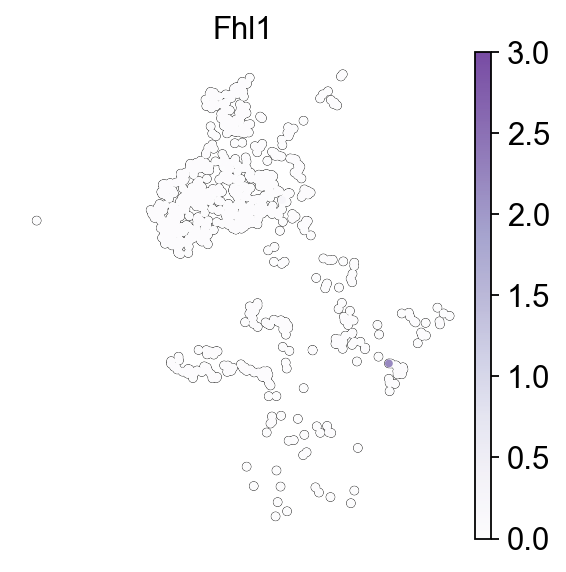

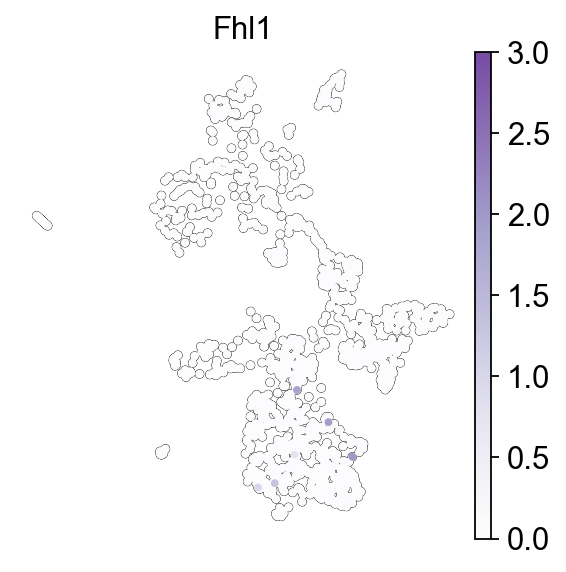

In [6]:
# Pit cell marker
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Fhl1'],vmax=(3), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples')#,save='_EKP_Tumor_markers.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Fhl1'],vmax=(3), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples')#,save='_RKP_Tumor_markers.pdf')

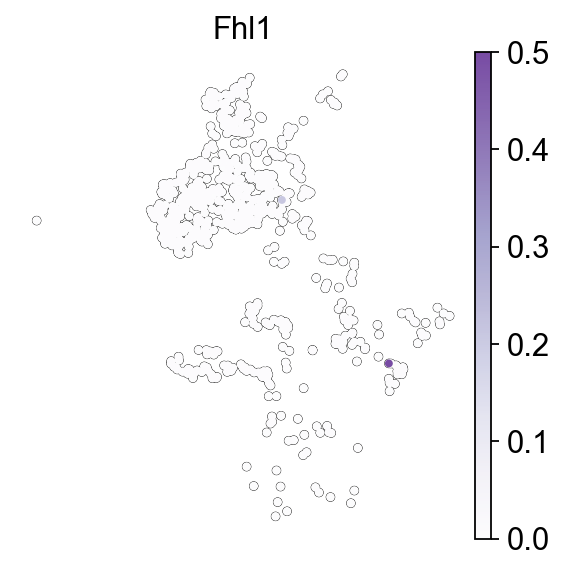

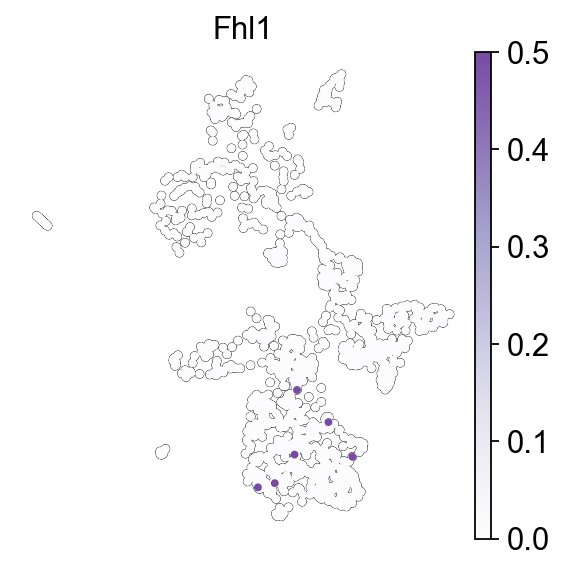

In [30]:
# Pit cell marker
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Fhl1'],vmax=(0.5), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples')#,save='_EKP_Tumor_pit_markers.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Fhl1'],vmax=(0.5), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples')#,save='_RKP_Tumor_pit_markers.pdf')

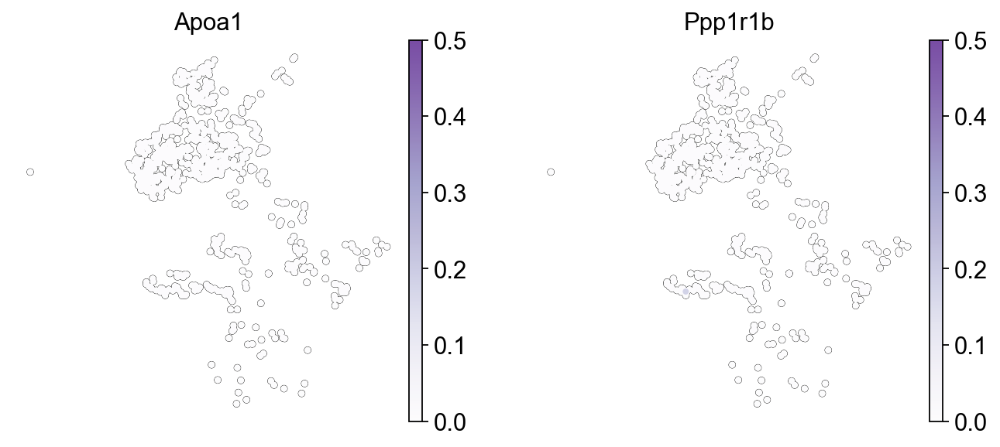

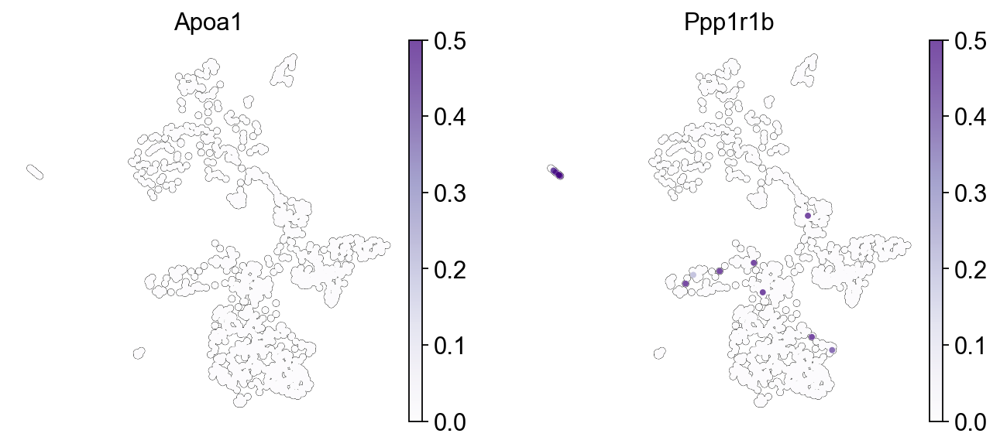

In [28]:
# Parietal cell marker
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Apoa1','Ppp1r1b'],vmax=(0.5), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_EKP_Tumor_parietal_markers.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Apoa1','Ppp1r1b'],vmax=(0.5), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_RKP_Tumor_parietal_markers.pdf')

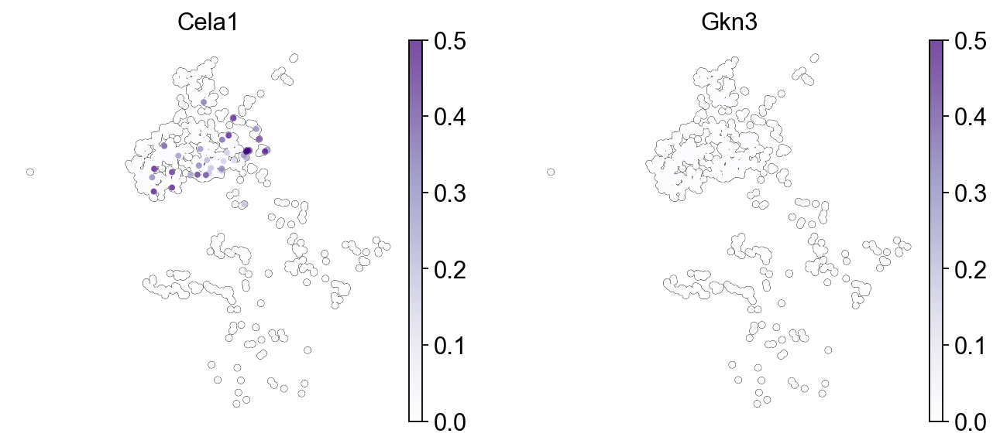

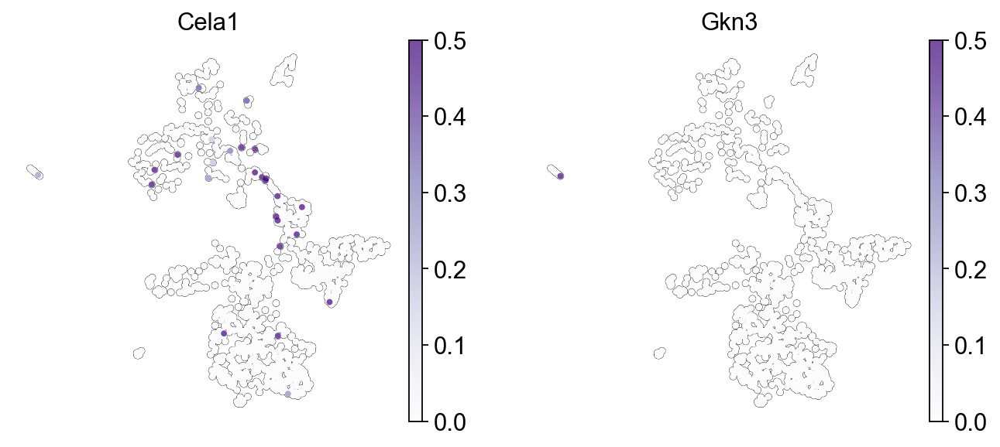

In [26]:
# Neck cell marker
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Cela1','Gkn3'],vmax=(0.5), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_EKP_Tumor_neck_markers.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Cela1','Gkn3'],vmax=(0.5), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_RKP_Tumor_neck_markers.pdf')

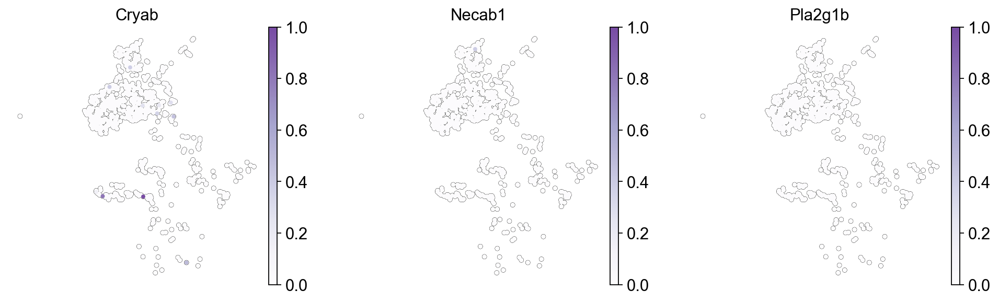

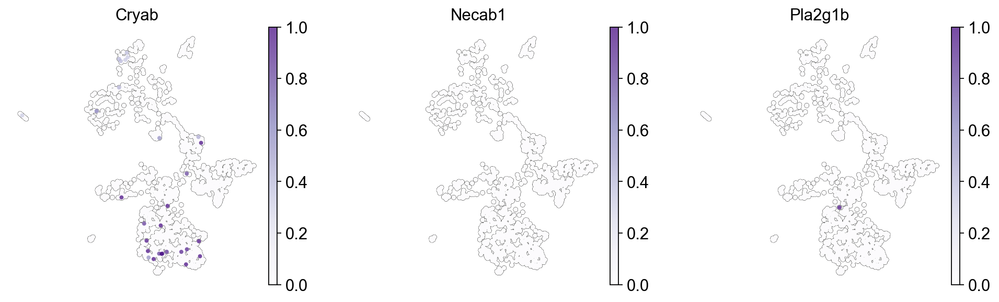

In [23]:
# Chief cell marker
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Cryab','Necab1','Pla2g1b'],vmax=(1), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_EKP_Tumor_chief_markers.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Cryab','Necab1','Pla2g1b'],vmax=(1), legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_RKP_Tumor_chief_markers.pdf')

# Run fgsea in R

# Gastric epithelial cells

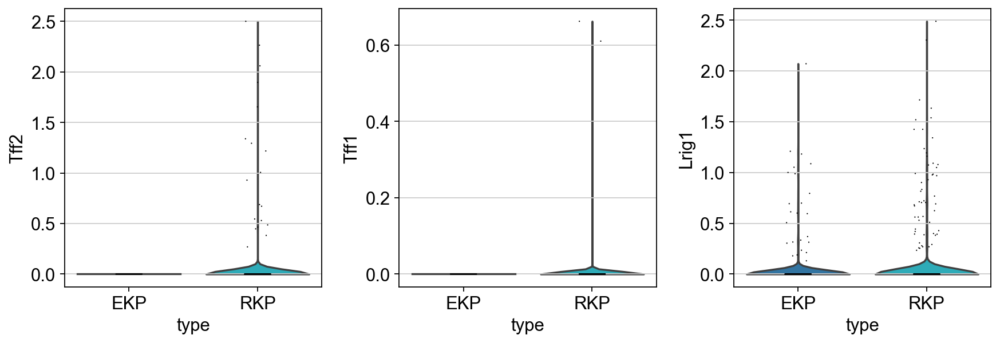

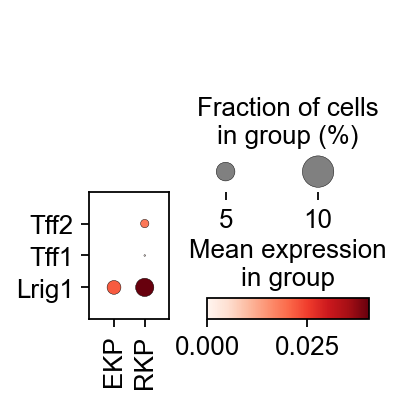

In [17]:
# long-term stemness: Lrig1
# Corpus
    # parietal cell: Atp4a
    # zymogenic chief cell: Gif
    # Mucous neck cell: Pgc, Tff2
    # surface mucous cell: Muc5ac, Tff1
sc.pl.violin(adata, [#'Atp4a','Gif','Pgc',
    'Tff2',#'Muc5ac',
    'Tff1','Lrig1'], groupby='type', swap_axes=False)#, save='_Mucs_by_type_1.pdf')
sc.pl.dotplot(adata, [#'Atp4a','Gif','Pgc',
    'Tff2',#'Muc5ac',
    'Tff1','Lrig1'], groupby='type', swap_axes=True)

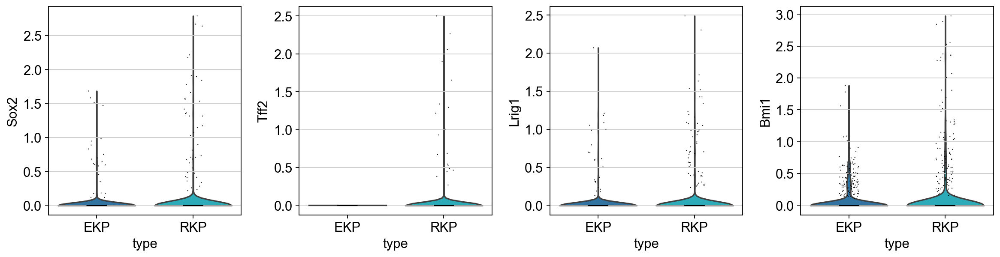

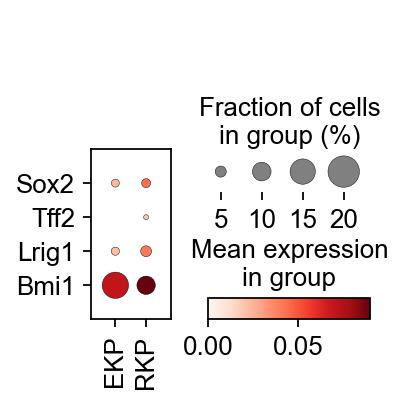

In [11]:
# Corpus
    # Base cell: Sox2, Tff2, Lrig1
    # Isthmus cell: Tff2, Mist1, eR1 (Runx1), Lrig1, Bmi1
# Antrum
    # Base cell: Lgr5, Sox2, Cck2r, eR1 (Runx1), Axin2, Lrig1, Aqp5
    #Isthmus cell: Vilin, Lrig1, Bmi1
sc.pl.violin(adata, ['Sox2','Tff2','Lrig1',#'Mist1',
                     'Bmi1'], groupby='type', swap_axes=False)#, save='_Mucs_by_type_1.pdf')
sc.pl.dotplot(adata, ['Sox2','Tff2','Lrig1',#'Mist1',
                      'Bmi1'], groupby='type', swap_axes=True)

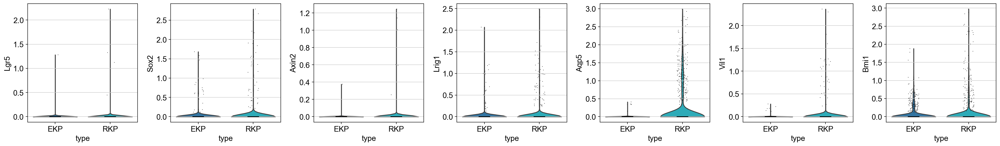

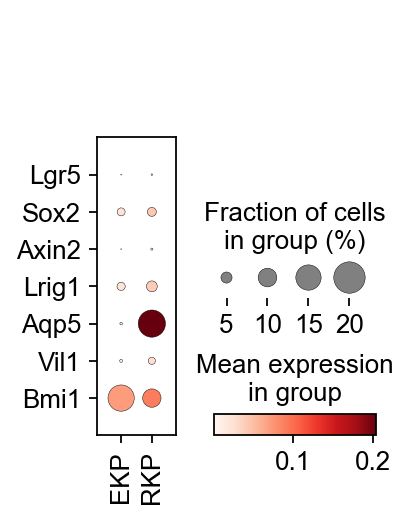

In [20]:
# Antrum
    # Base cell: Lgr5, Sox2, Cck2r, eR1, Axin2, Lrig1, Aqp5
    #Isthmus cell: Vilin, Lrig1, Bmi1
sc.pl.violin(adata, ['Lgr5','Sox2',#'Cckbr',
                     'Axin2','Lrig1','Aqp5','Vil1','Bmi1'], groupby='type', swap_axes=False)#, save='_Mucs_by_type_1.pdf')
sc.pl.dotplot(adata, ['Lgr5','Sox2',#'Cckbr',
                      'Axin2','Lrig1','Aqp5','Vil1','Bmi1'], groupby='type', swap_axes=True)

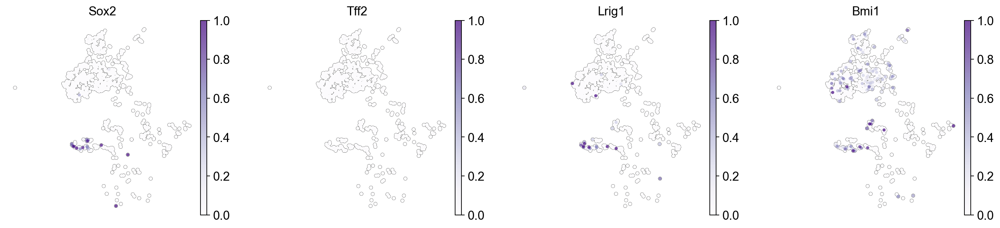

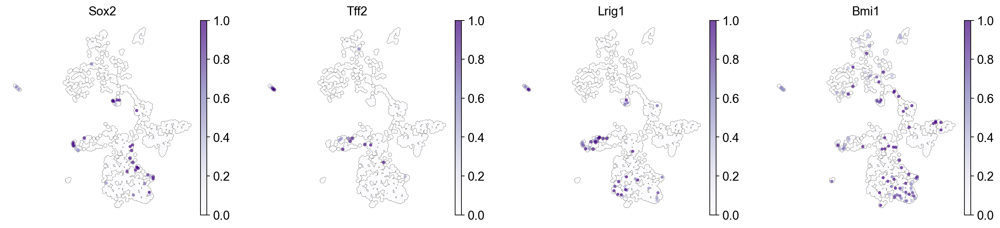

In [16]:
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Sox2','Tff2','Lrig1','Bmi1'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=1, size=50, cmap='Purples')#,save='_MFAP4_CELF2_in_Tumor.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Sox2','Tff2','Lrig1','Bmi1'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=1, size=50, cmap='Purples')#,save='_MFAP4_CELF2_in_Tumor.pdf')

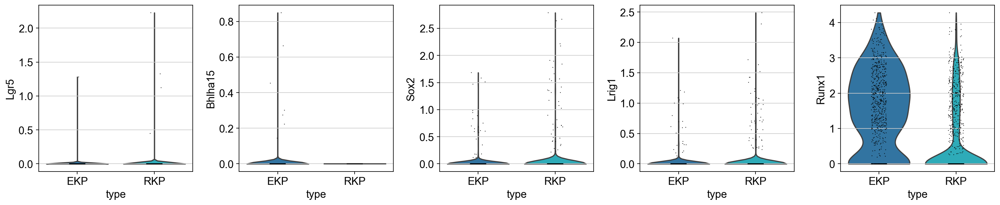

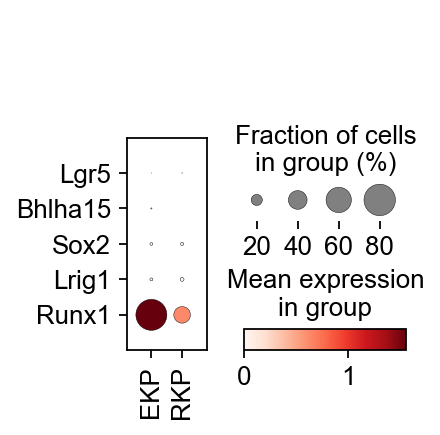

In [48]:
# Gastric (cancer) stem cell
    # stem/progenitor: Lgr5, Troy, Mist1, Sox2, Lrig1, Cck2r, Runx1
sc.pl.violin(adata, ['Lgr5',#'Troy',
                     'Bhlha15',
                     'Sox2','Lrig1',#'Cck2r',
                     'Runx1'], groupby='type', swap_axes=False, save='_Gastric_stem_cell_markers_by_type.png')
sc.pl.dotplot(adata, ['Lgr5',#'Troy',
                     'Bhlha15',
                     'Sox2','Lrig1',#'Cck2r',
                     'Runx1'], groupby='type', swap_axes=True, save='_Gastric_stem_cell_markers_by_type.pdf')

In [55]:
pval_table_T_ekprkp.loc[pval_table_T_ekprkp['RKP_na'].isin(['Lgr5',#'Troy',
                     'Bhlha15',
                     'Sox2','Lrig1',#'Cck2r',
                     'Runx1'])]

,EKP_na,EKP_pv,RKP_na,RKP_pv
1899,Gmppa,2.888333e-15,Lrig1,6.124589e-02
2111,Gm48302,2.447633e-13,Sox2,9.376089e-02
5037,Serpinb2,3.278041e-03,Lgr5,4.718417e-01
14149,Ociad1,8.294344e-01,Bhlha15,5.388304e-02
20329,Chd3,4.483244e-18,Runx1,2.529629e-65


In [ ]:
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Runx1'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=1, size=50, cmap='Purples')#,save='_MFAP4_CELF2_in_Tumor.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=[], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=1, size=50, cmap='Purples')#,save='_MFAP4_CELF2_in_Tumor.pdf')

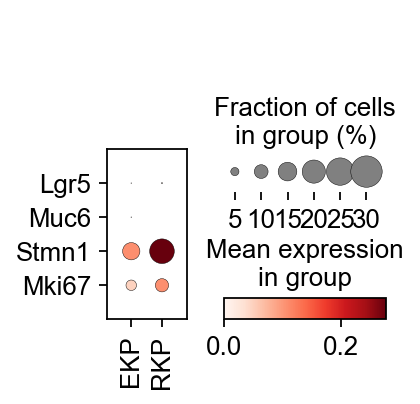

In [29]:
sc.pl.dotplot(adata, ['Lgr5',#'Troy', # base stem cell
                      'Muc6', # Neck cell lineage
                     'Stmn1','Mki67',#'Muc5ac',# Pit cell lineage
                     ], groupby='type', swap_axes=True)

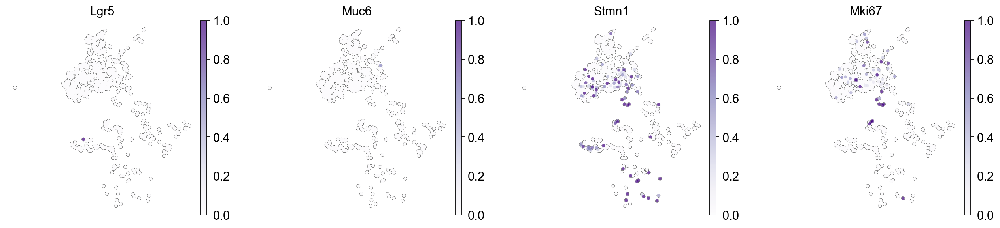

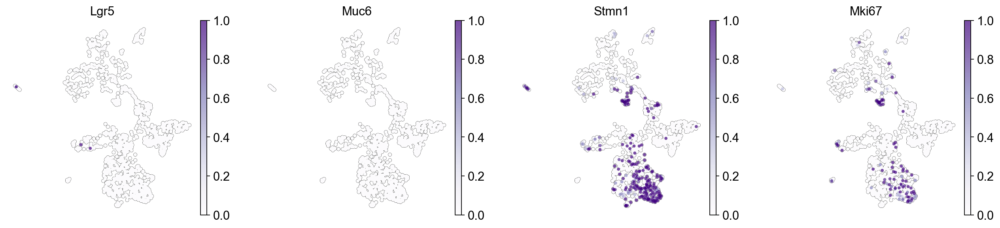

In [30]:
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Lgr5',#'Troy', # base stem cell
                      'Muc6', # Neck cell lineage
                     'Stmn1','Mki67',#'Muc5ac',# Pit cell lineage
                     ], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=1, size=50, cmap='Purples')#,save='_MFAP4_CELF2_in_Tumor.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Lgr5',#'Troy', # base stem cell
                      'Muc6', # Neck cell lineage
                     'Stmn1','Mki67',#'Muc5ac',# Pit cell lineage
                     ], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=1, size=50, cmap='Purples')#,save='_MFAP4_CELF2_in_Tumor.pdf')

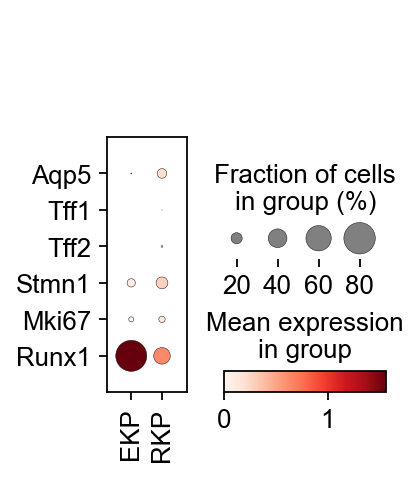

In [36]:
sc.pl.dotplot(adata, ['Aqp5', # basal stem cell, frequently expressed in diffuse subtype
                      'Tff1','Tff2', # surface mucous, # mucous neck
                      'Stmn1','Mki67', # actively cycling isthmus progenitor 
                      #'Muc5ac',# Pit cell lineage,
                      'Runx1' #Isthmic cell marker
                     ], groupby='type', swap_axes=True, save=)

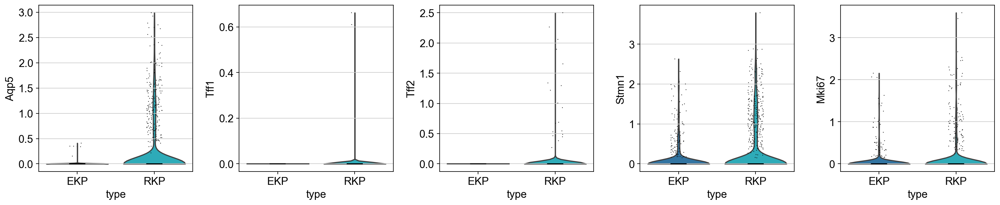

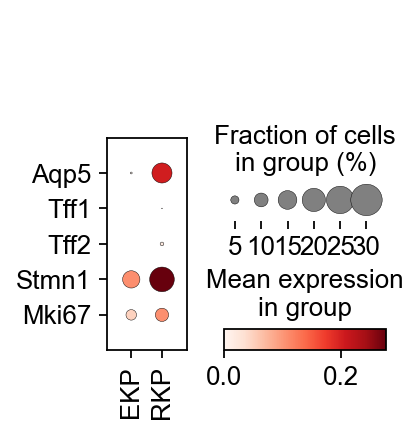

In [47]:
sc.pl.violin(adata, ['Aqp5', # basal stem cell, frequently expressed in diffuse subtype
                      'Tff1','Tff2', # surface mucous, # mucous neck
                      'Stmn1','Mki67', # actively cycling isthmus progenitor 
                      #'Muc5ac',# Pit cell lineage,
                     ], groupby='type', swap_axes=False, save='_Gastric_stem_cell_progenitor_no_Runx1.png')
sc.pl.dotplot(adata, ['Aqp5', # basal stem cell, frequently expressed in diffuse subtype
                      'Tff1','Tff2', # surface mucous, # mucous neck
                      'Stmn1','Mki67', # actively cycling isthmus progenitor 
                      #'Muc5ac',# Pit cell lineage,
                     ], groupby='type', swap_axes=True, save='_gastric_stem_progenitor_no_Runx1.pdf')

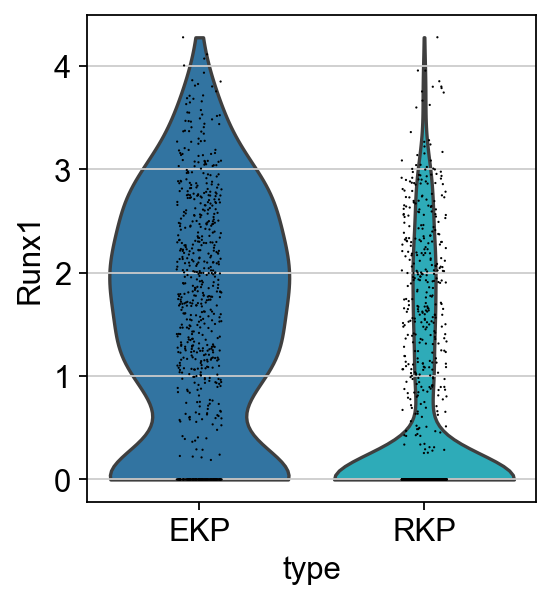

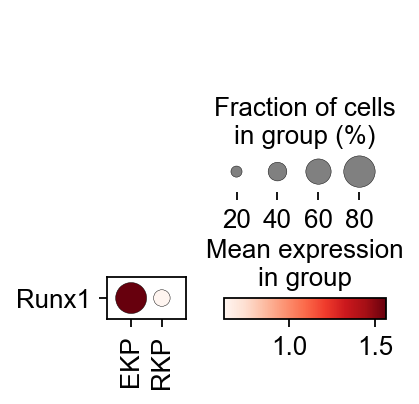

In [46]:
sc.pl.violin(adata, ['Runx1' #Isthmic cell marker
                    ], groupby='type', swap_axes=False, save='_Gastric_stem_Runx1.png')
sc.pl.dotplot(adata, ['Runx1' #Isthmic cell marker
                       ], groupby='type', swap_axes=True, save='_gastric_stem_Runx1.pdf')

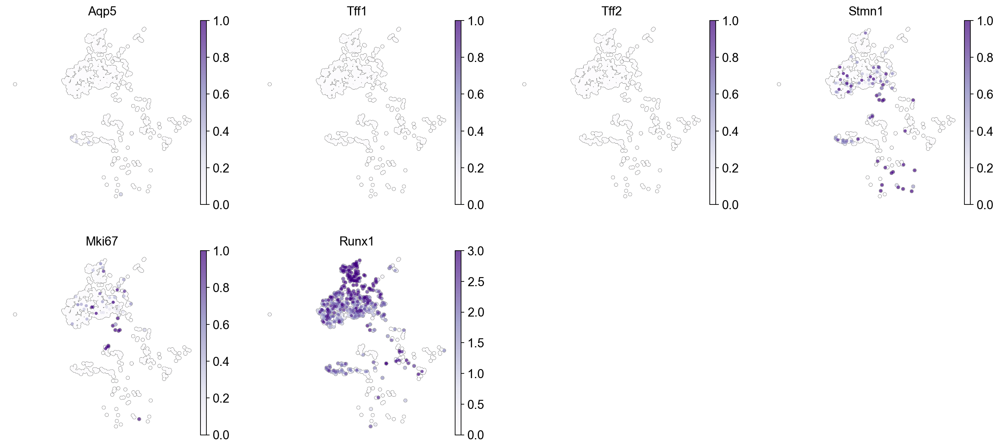

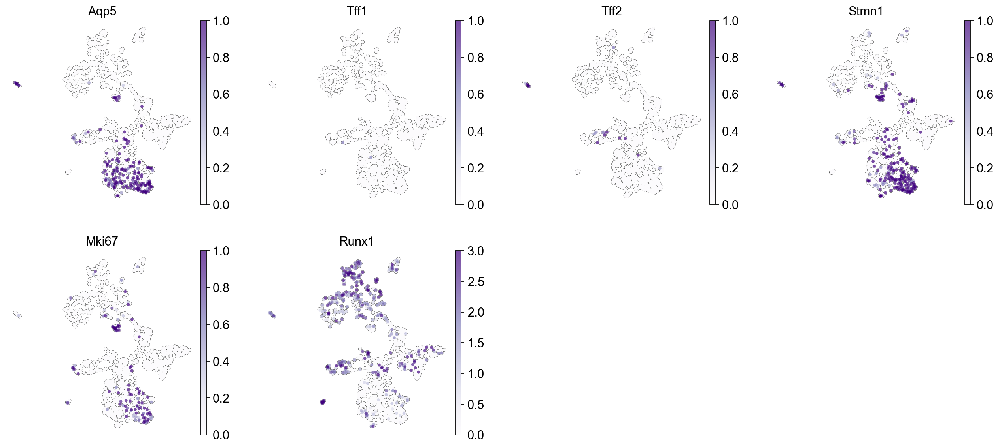

In [43]:
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Aqp5', # basal stem cell
                      'Tff1','Tff2', # surface mucous, # mucous neck
                      'Stmn1','Mki67', # actively cycling isthmus progenitor 
                      #'Muc5ac',# Pit cell lineage,
                      'Runx1' #Isthmic cell marker
                     ], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=[1,1,1,1,1,3], size=50, cmap='Purples',save='_gastric_stem_progenitor_EKP.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Aqp5', # basal stem cell
                      'Tff1','Tff2', # surface mucous, # mucous neck
                      'Stmn1','Mki67', # actively cycling isthmus progenitor 
                      #'Muc5ac',# Pit cell lineage,
                      'Runx1' #Isthmic cell marker
                     ], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=[1,1,1,1,1,3], size=50, cmap='Purples',save='_gastric_stem_progenitor_RKP.pdf')

In [ ]:
sc.pl.violin(adata, ['Yap1'], groupby='type', swap_axes=False)#, save='_Ctnnb1_by_type.pdf')
sc.pl.dotplot(adata, ['Yap1'], groupby='type', swap_axes=True)#, save='_Ctnnb1_by_type.pdf')

In [66]:
pval_table_T_ekprkp.loc[pval_table_T_ekprkp['RKP_na'].isin(['Yap1'])] # not significant

,EKP_na,EKP_pv,RKP_na,RKP_pv
5956,Smg8,0.030263,Yap1,0.737053


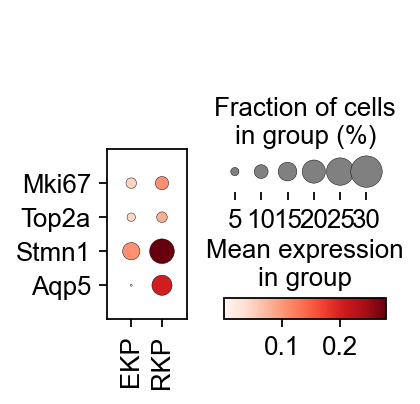

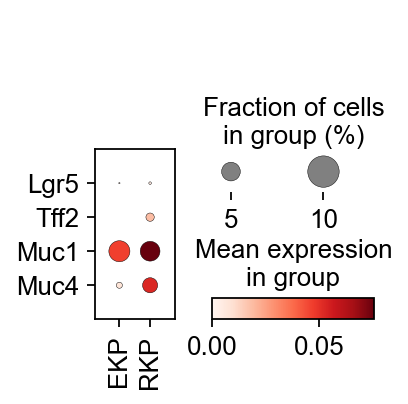

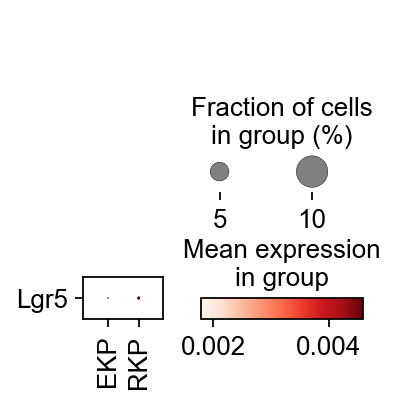

In [13]:
sc.pl.dotplot(adata, ['Mki67','Top2a','Stmn1','Aqp5'], groupby='type', swap_axes=True, save='_csc_markers_by_genotype.pdf')
sc.pl.dotplot(adata, ['Lgr5','Tff2','Muc1','Muc4'], groupby='type', swap_axes=True, save='_Lgr5_Tff2_Mucs_by_genotype.pdf')
sc.pl.dotplot(adata, ['Lgr5'], groupby='type', swap_axes=True)

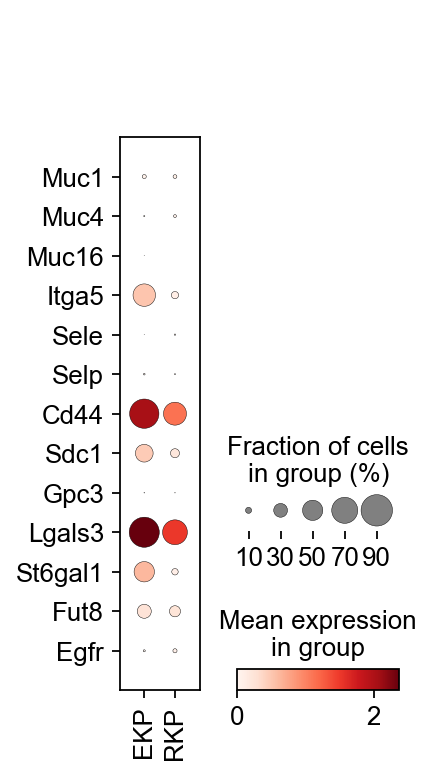

In [60]:
sc.pl.dotplot(adata, ['Muc1','Muc4','Muc16','Itga5','Sele','Selp','Cd44','Sdc1','Gpc3','Lgals3','St6gal1','Fut8','Egfr'], groupby='type', swap_axes=True, save='_Glycocalix_markers_by_genotype.pdf')

In [9]:
adata.uns['log1p']["base"] = None

In [10]:
#for fGSEA
sc.tl.rank_genes_groups(adata, groupby='type', method='wilcoxon', use_raw=True,  key_added = "type_rank")
result = adata.uns['type_rank']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores','logfoldchanges', 'pvals', 'pvals_adj']}).to_csv("D:/KP/EKP_RKP/EKP_vs.RKP_epithelial_DEG.csv")
# logFC becomes negative or disappear when use_raw=False, could be Scanpy bug


ranking genes
    finished: added to `.uns['type_rank']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


# AREG analysis

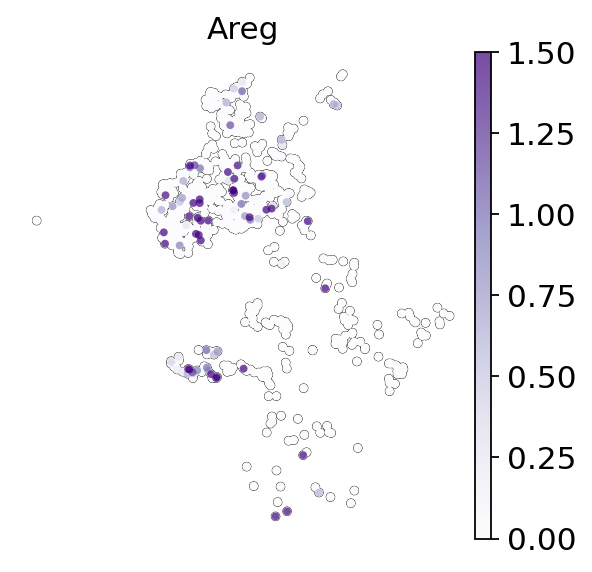

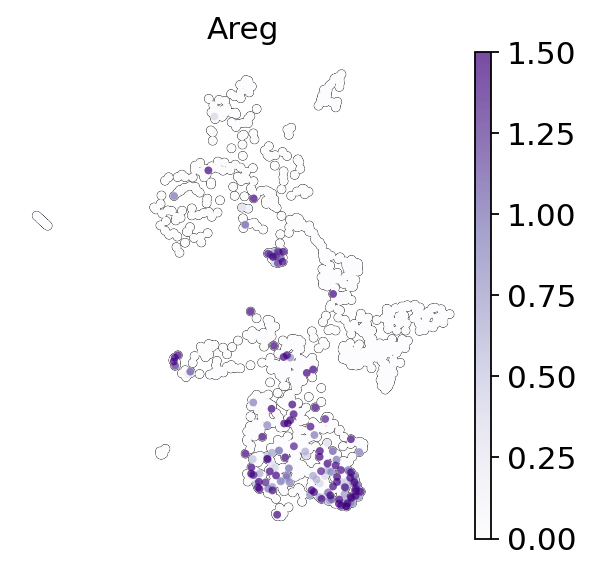

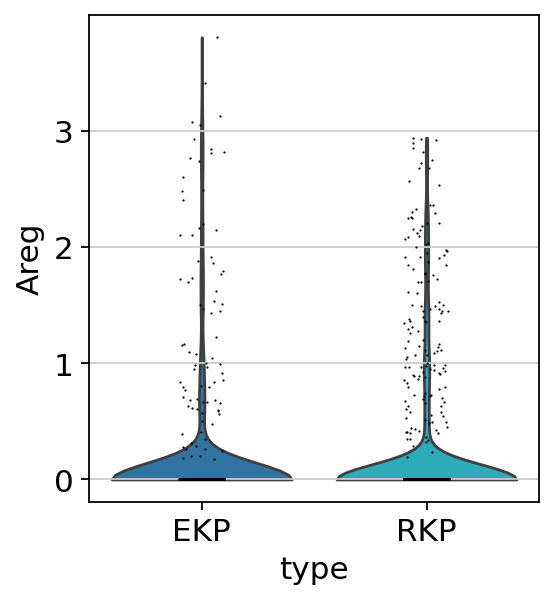

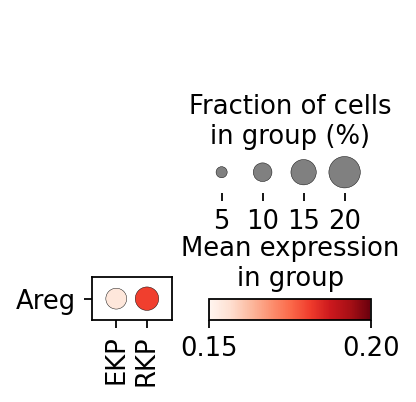

In [46]:
sc.pl.umap(adata[adata.obs['type']=='EKP'], color=['Areg'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=[1.5], size=50, cmap='Purples',save='_Areg_EKP_tumor.pdf')
sc.pl.umap(adata[adata.obs['type']=='RKP'], color=['Areg'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05),vmin=0, vmax=[1.5], size=50, cmap='Purples',save='_Areg_RKP_tumor.pdf')

sc.pl.violin(adata, ['Areg'], groupby='type', save='_Areg_in_EKP_RKP_tumor.pdf')
sc.pl.dotplot(adata, ['Areg'], groupby='type', swap_axes=True, vmin=0.15, vmax=0.2, dot_min=0, save='_Areg_in_EKP_RKP_tumor.pdf')

In [12]:
pval_table_T_ekprkp.loc[pval_table_T_ekprkp['RKP_na'].isin(['Areg','Btc'])]

,EKP_na,EKP_pv,RKP_na,RKP_pv
322,Atp9b,3.034507e-48,Btc,1.077280e-10
3847,Top2b,2.371552e-05,Areg,4.181519e-01
